# Example code for synthesizing DWI

In [1]:
import sys, os
sys.path.append('..')

import numpy as np
import h5py
from time import time
import matplotlib.pyplot as plt

import torch
from torch.autograd import Variable
from mains.trainer import dwi_Trainer
from data.dwi_utils import read_h5
from utils.utilization import get_config
from utils.visualization import create_group_fig

## Configure the generator and load a model

In [2]:
config = get_config('../configs/smri2dwi.yaml')
ckpt = os.path.join('../logs/pretrain/gen.pt')

In [3]:
trainer = dwi_Trainer(config)
net = trainer.gen_a

resnet
G Trainable: 13.603969/13.603969M
Deploy to cuda:0
Init generator with gaussian
GAN with unet discriminator
D Trainable: 3.475655/3.495788M


In [4]:
state_dict = torch.load(ckpt, map_location=trainer.device)
net.load_state_dict(state_dict['a'])
_ = net.eval()

## The function for one pass of the network to synthesize a DWI from structural inputs

In [5]:
def synthesize_slice_per_bvec_bval(norm_b0, t2, t1, s, net, direction, bvalue):
    with torch.no_grad():
        v_st = time()
        x, y, _ = norm_b0.shape
        out2d = np.zeros([x, y])
        in_c = 0
        in_slice = None
        if norm_b0 is not None:
            b0_slice = norm_b0[min_x:max_x, min_y:max_y, s].transpose()
            in_c += 1
            in_slice = np.expand_dims(b0_slice, -1).astype(np.float32)
        if t2 is not None:
            in_c += 1
            t2_slice = t2[min_x:max_x, min_y:max_y, s].transpose()
            t2_slice = t2_slice / (1e-6 + t2_slice.max())
            t2_slice = np.clip(t2_slice, 0., 1.)
            t2_slice = np.expand_dims(t2_slice, -1).astype(np.float32)
            if in_slice is None:
                in_slice = t2_slice
            else:
                in_slice = np.concatenate((in_slice, t2_slice), axis=-1)
        if t1 is not None:
            in_c += 1
            t1_slice = t1[min_x:max_x, min_y:max_y, s].transpose()
            t1_slice = t1_slice / (1e-6 + t1_slice.max())
            t1_slice = np.clip(t1_slice, 0., 1.)
            t1_slice = np.expand_dims(t1_slice, -1).astype(np.float32)
            if in_slice is None:
                in_slice = t1_slice
            else:
                in_slice = np.concatenate((in_slice, t1_slice), axis=-1)

        raw_x, raw_y = in_slice.shape[0], in_slice.shape[1]
        xs = np.zeros([pad_x, pad_y, in_c])
        xs[:raw_x, :raw_y, :] = in_slice

        xs = xs.transpose(2, 0, 1)

        input = Variable(torch.from_numpy(xs.copy())).unsqueeze(0).cuda().float()
        cond = Variable(torch.from_numpy(direction.copy())).unsqueeze(0).cuda().float()
        bv = Variable(torch.from_numpy(np.array([bvalue]).copy())).unsqueeze(0).cuda().float()
        cond = torch.cat((cond, bv), dim=-1)
        st = time()
        output = net(input, cond)
        et = time()
        mask = (input[:, 0, :, :] > 0.).float().expand_as(output)
        output = output * mask
        out_np = output[0, 0, :raw_x, :raw_y].cpu().numpy().transpose()
        out2d[min_x:max_x, min_y:max_y] = out_np
        v_et = time()
        #print('Processing time %.2f sec for one slice' % (v_et - v_st))
        return out2d


## Load the subject data from h5 file

In [6]:
data = '../datasets/data_HCP_wuminn/101309.h5'

In [7]:
data_dict = read_h5(data, '101309', False, 
                    slice_idx=None, dir_idx=None, 
                    return_dwi=True, load_noddi=False, load_t12=True)

../datasets/data_HCP_wuminn/101309.h5
(234, 3)
<KeysViewHDF5 ['affine', 'ak', 'b0', 'b0_max', 'mk', 'msd', 'ndi', 'odi', 'rk', 'rtop', 't1', 't2', 'train_bval', 'train_bvec', 'train_dwi', 'train_idx', 'val_bval', 'val_bvec', 'val_dwi', 'val_idx']>
loading dwi (234, 145, 174, 145)
0.5358 sec (234, 145, 174, 145)


### Define some data specific parameters

In [8]:
s = 70  # The axial view slice we will use for running the inference 
min_x, max_x, min_y, max_y = 14, 132, 10, 163  # the center crop range for the input 
pad_x, pad_y = 160, 160  # the pad size of the input image 
bval_max = 3010  # maximum b-value used for normalization purpose

### Visualize the model input candidates: B0, T2 and T1 images

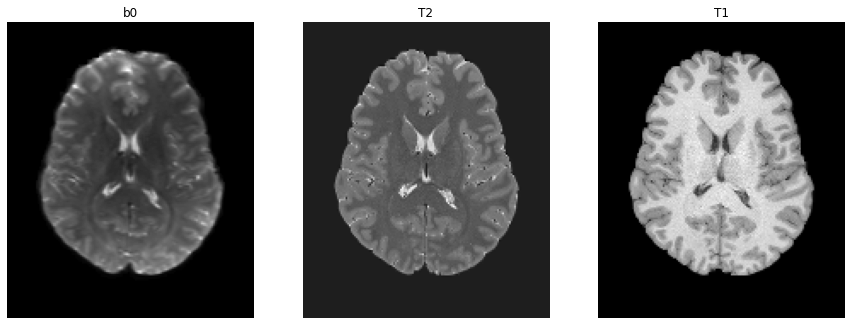

In [9]:
b0_max, bvec, bval, image_norm =  data_dict['b0_max'], data_dict['bvec'], data_dict['bval'], data_dict['dwi']
norm_b0 = data_dict['b0']
t2 = data_dict['t2']
t1 = data_dict['t1']
fig = create_group_fig([np.flip(norm_b0[...,s].T), np.flip(t2[...,s].T), np.flip(t1[...,s].T)], 
                       1, titles=['b0','T2','T1'], cmaps='gist_gray')

## Synthesize an image from the gradient table of the data

In [10]:
dir = 2
direction, bvalue = bvec[dir], bval[dir]/bval_max
direction, bvalue

(array([-0.717034,  0.274101, -0.640884], dtype=float32), 0.6611295681063123)

In [11]:
synth1 = synthesize_slice_per_bvec_bval(norm_b0, t2, t1, s, net, bvec[dir], bval[dir]/bval_max)

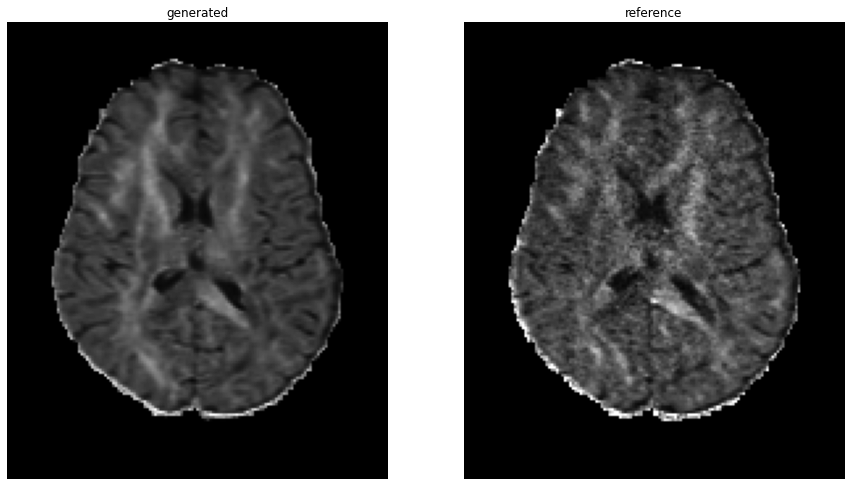

In [15]:
fig = create_group_fig([np.flip(synth1.T), np.flip(image_norm[dir,...,s].T)], 1, 
                       cmaps='gist_gray', 
                       titles=['generated','reference'])

## Synthesize images from synthetic bvectors and bvalues

In [16]:
def synth_bvec_bvals(n_pts=64, bvals=2000):
    from dipy.core.geometry import sphere2cart 
    theta = np.arange(n_pts) / n_pts * np.pi  # Limited to 0,pi
    phi = 0
    bvecs_synth = sphere2cart(1, theta, phi)  # Let's assume they're all unit vecs
    bvals_synth = np.ones([n_pts, ]) * bvals
    bvecs_synth = np.array(bvecs_synth).T
    return bvecs_synth, bvals_synth

In [17]:
bvecs_synth, bvals_synth = synth_bvec_bvals(64,2000)
sortidx = np.argsort(-1*bvecs_synth[:,2])
bvecs_synth1 = bvecs_synth[sortidx]
bvecs_synth2 = bvecs_synth[sortidx]*-1

In [18]:
bvecs_synth = np.concatenate((bvecs_synth1, bvecs_synth2), axis=0)
bvals_synth = np.concatenate((bvals_synth, bvals_synth), axis=0)
print(bvecs_synth.shape, bvals_synth.shape)

(128, 3) (128,)


0
1.2223223447799683
1.101753830909729


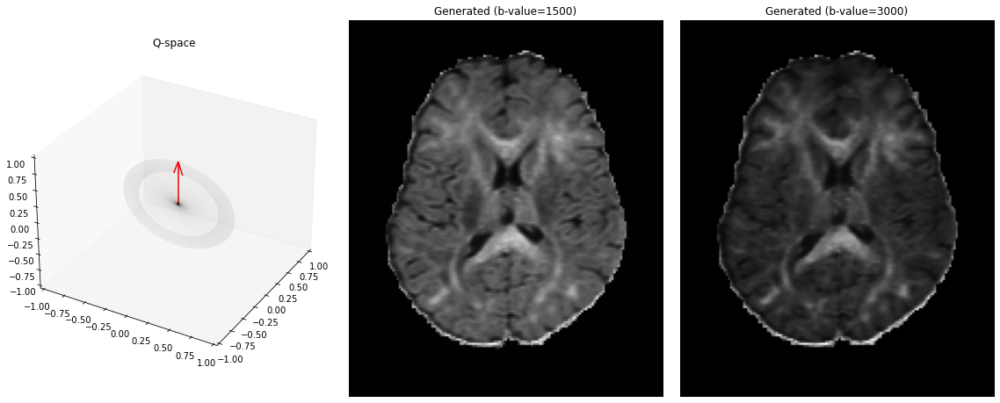

1
1.2174071073532104
1.0995386838912964


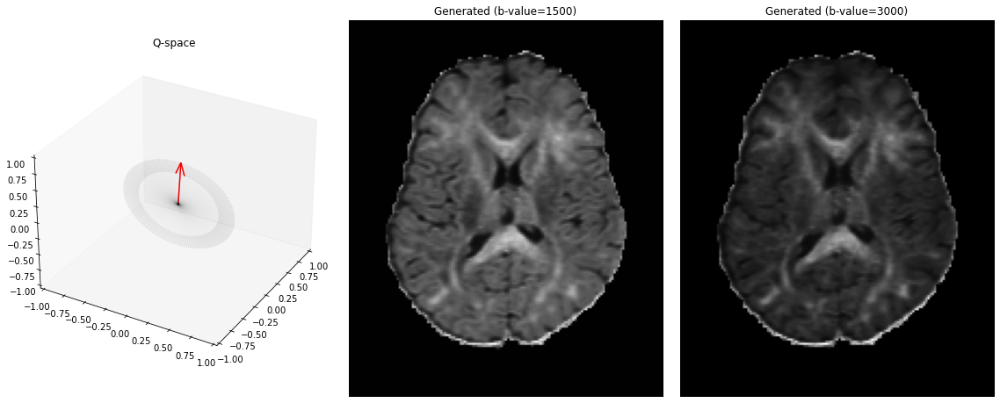

2
1.212448239326477
1.096876621246338


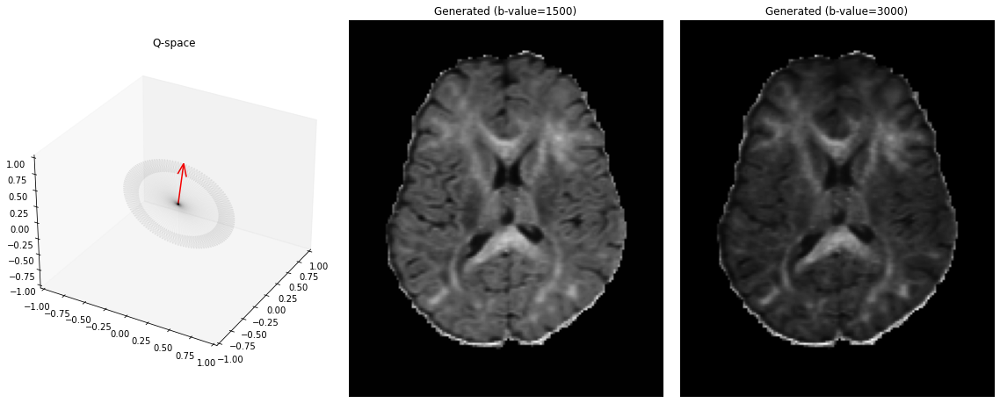

3
1.2074494361877441
1.094125509262085


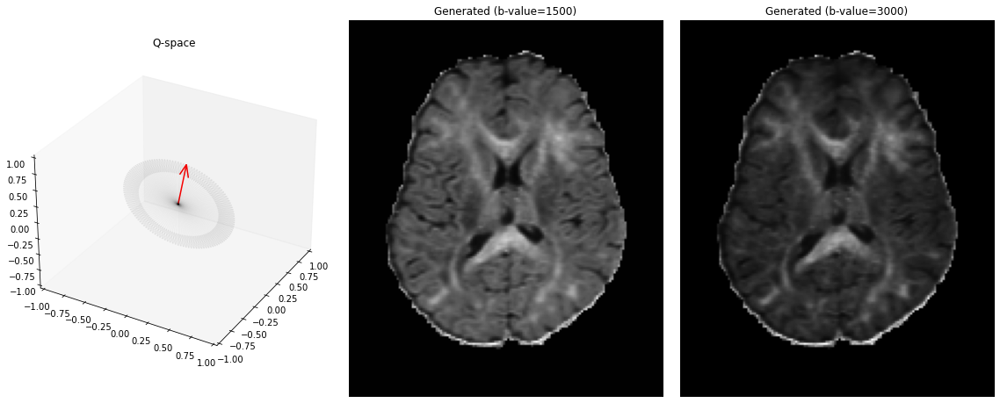

4
1.2030096054077148
1.0916063785552979


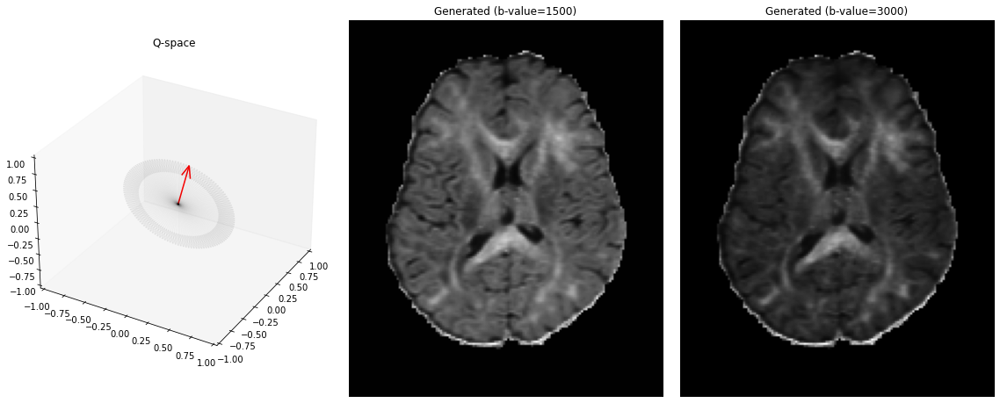

5
1.1997383832931519
1.0894775390625


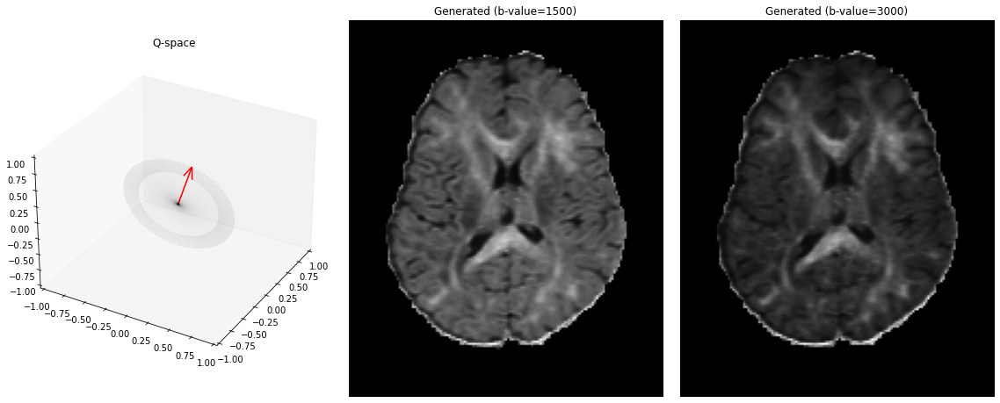

6
1.1959240436553955
1.0886868238449097


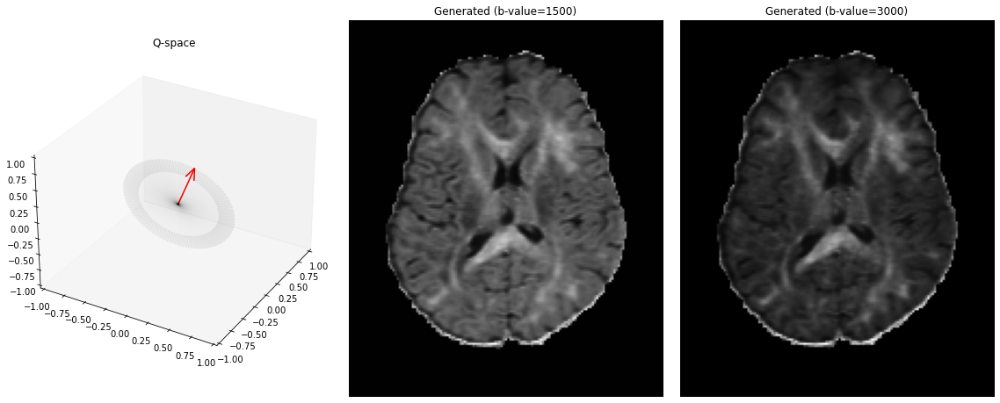

7
1.192954421043396
1.0901294946670532


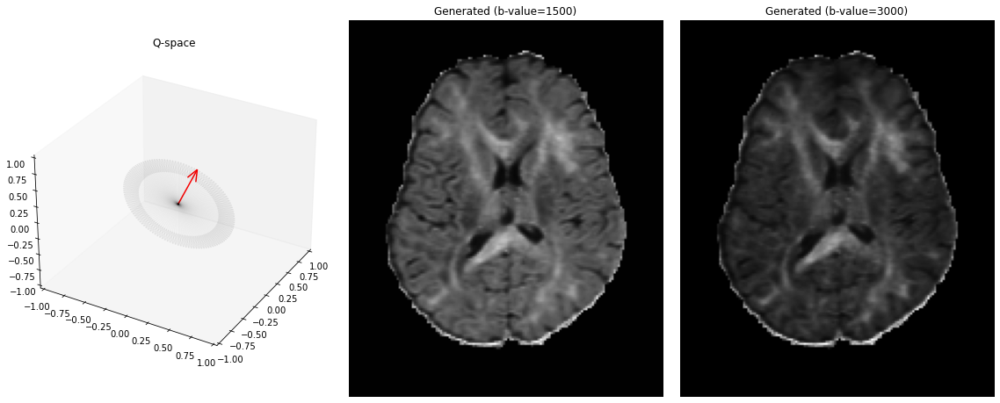

8
1.1897976398468018
1.0915650129318237


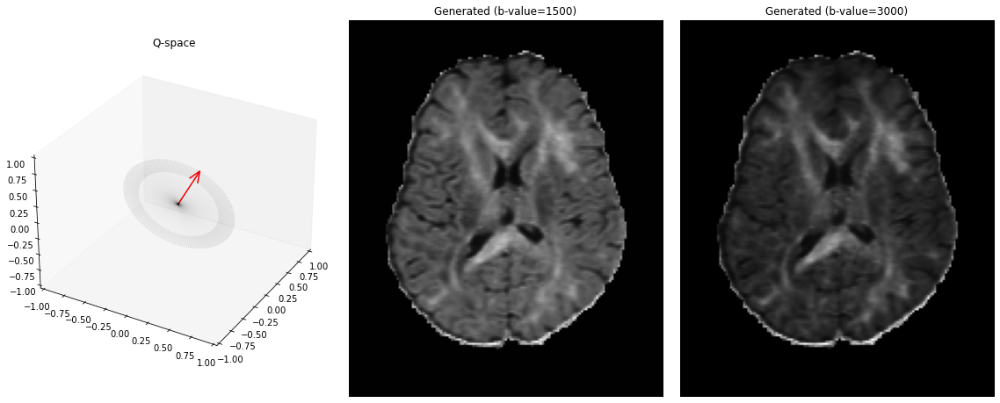

9
1.1872061491012573
1.093527913093567


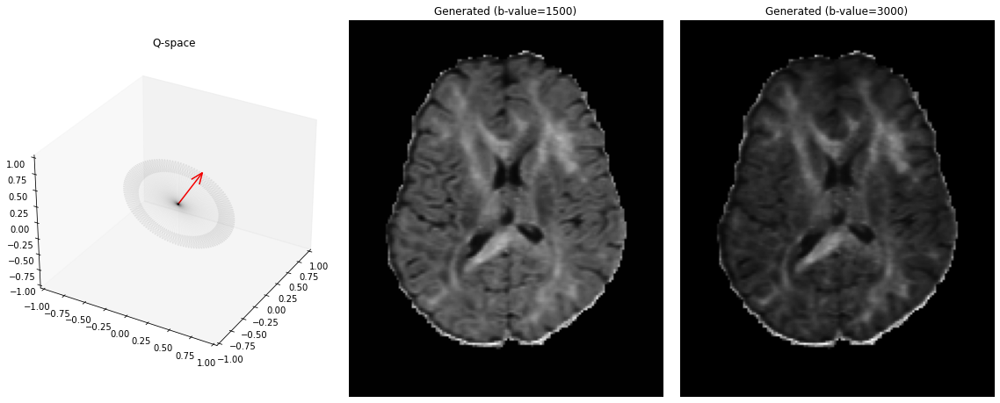

10
1.1839543581008911
1.095024824142456


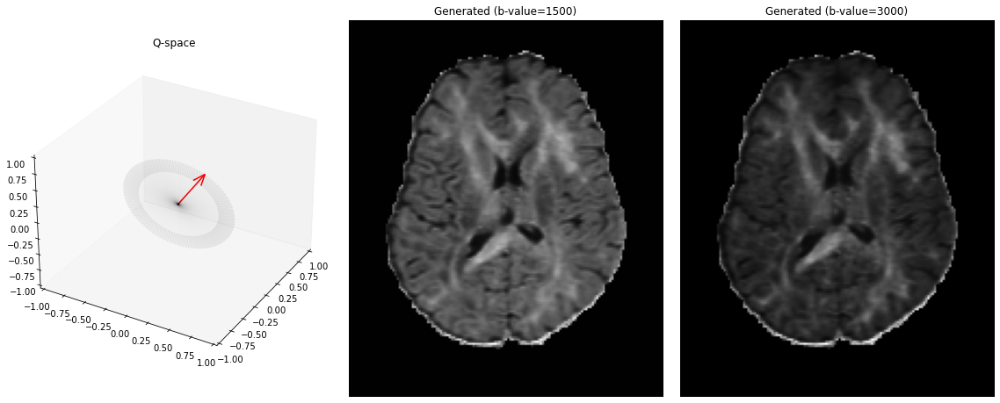

11
1.1802968978881836
1.0967813730239868


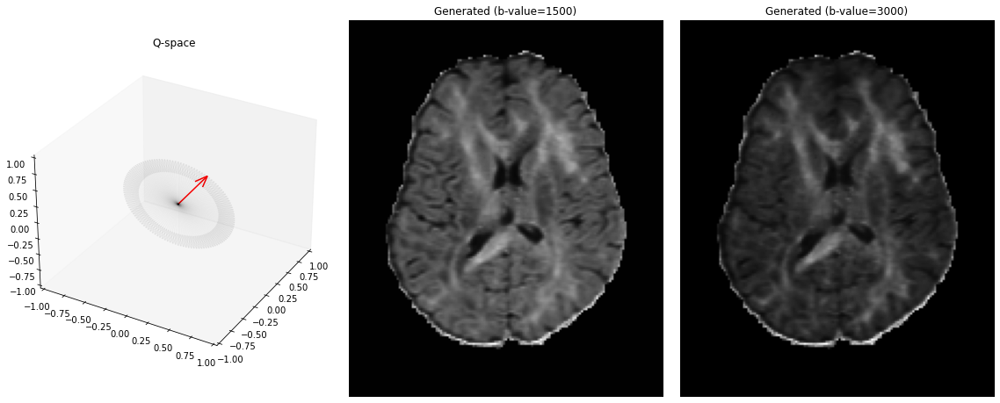

12
1.177382230758667
1.0980955362319946


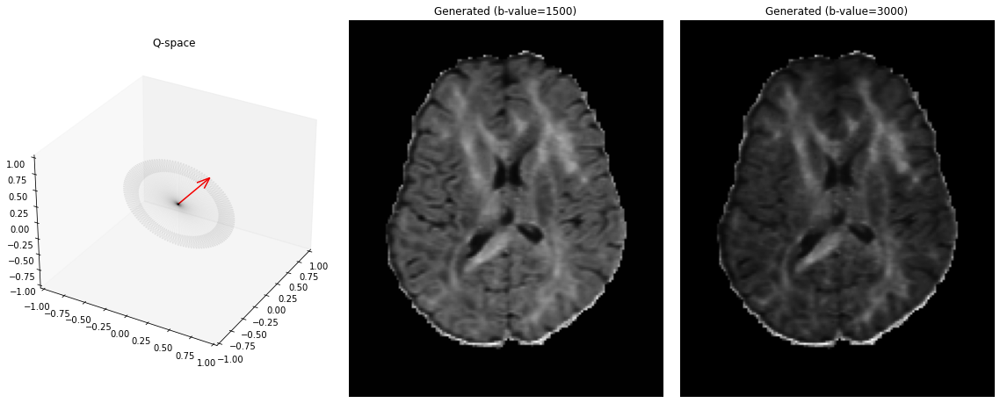

13
1.1777640581130981
1.0993990898132324


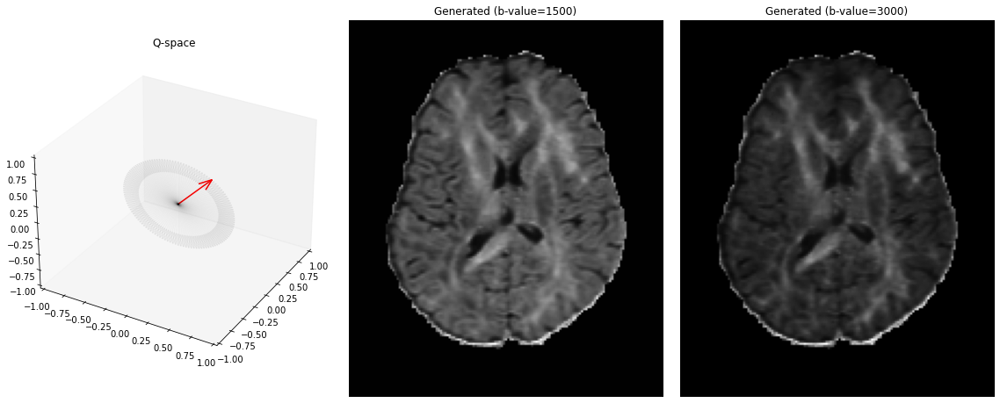

14
1.1793400049209595
1.10068941116333


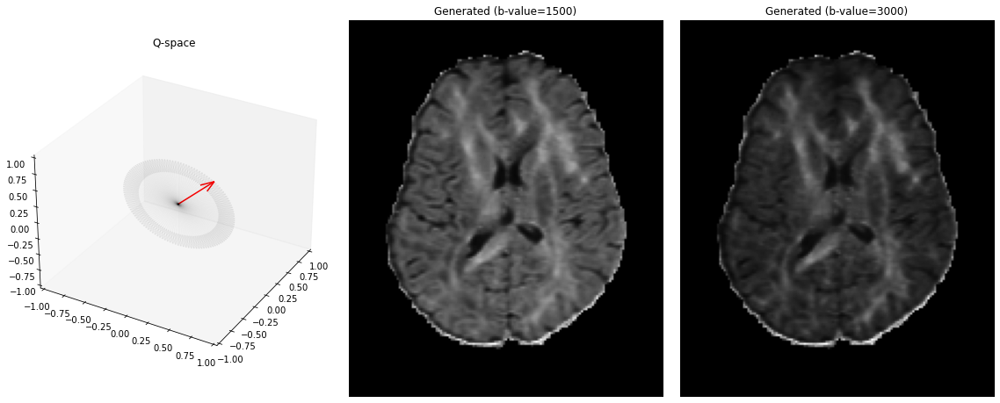

15
1.1796518564224243
1.1018260717391968


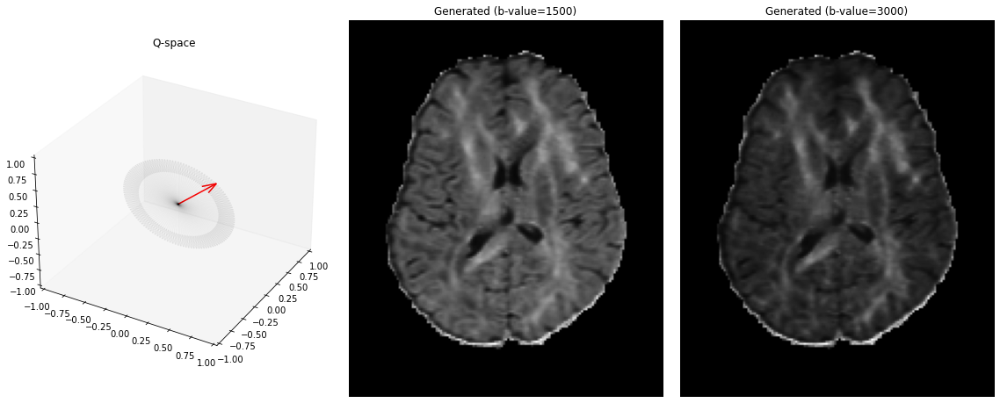

16
1.177464485168457
1.1032326221466064


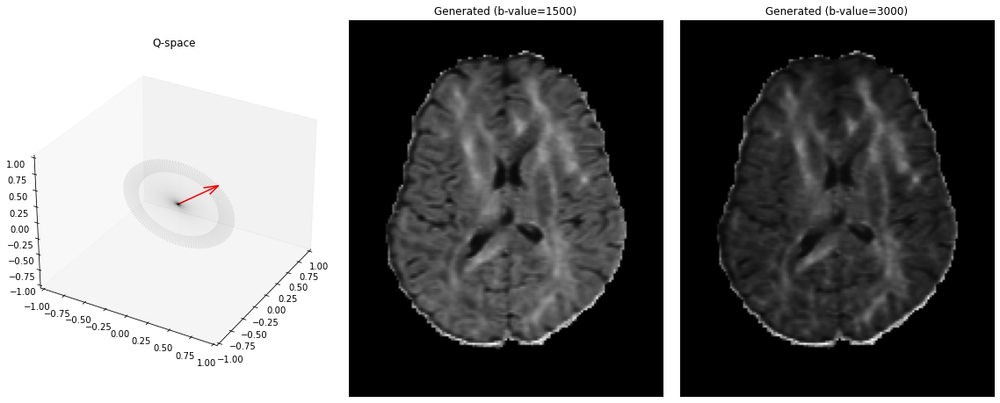

17
1.174753189086914
1.1043705940246582


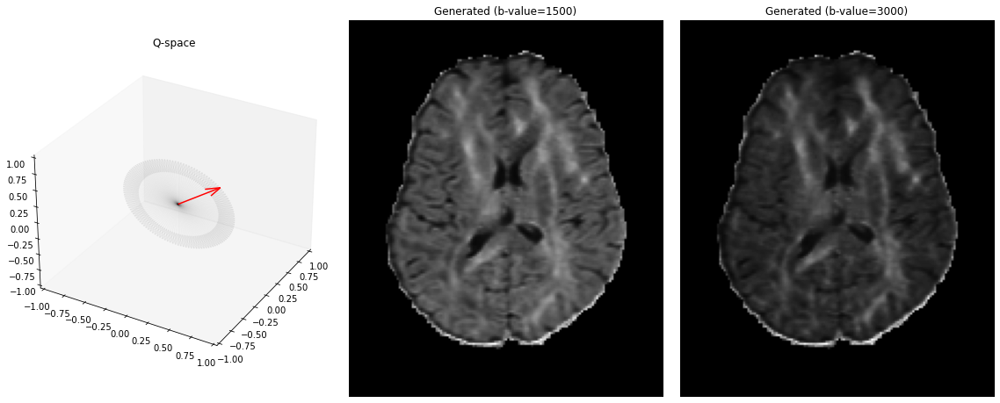

18
1.1745914220809937
1.1054000854492188


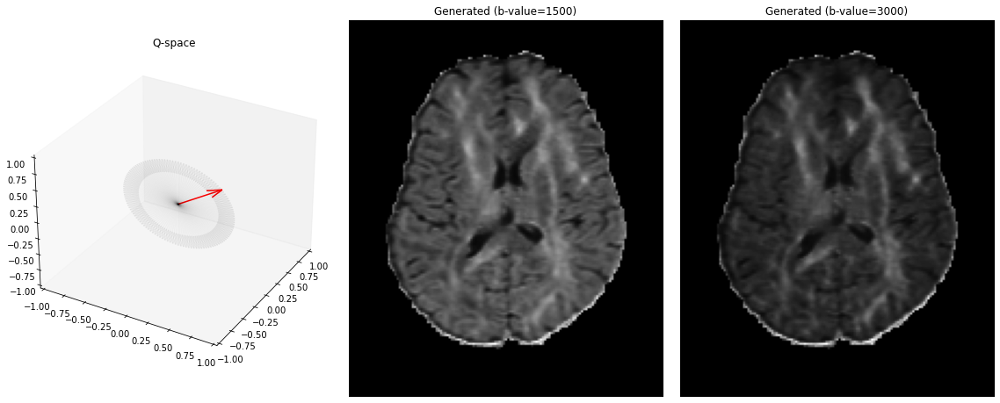

19
1.1762471199035645
1.1063368320465088


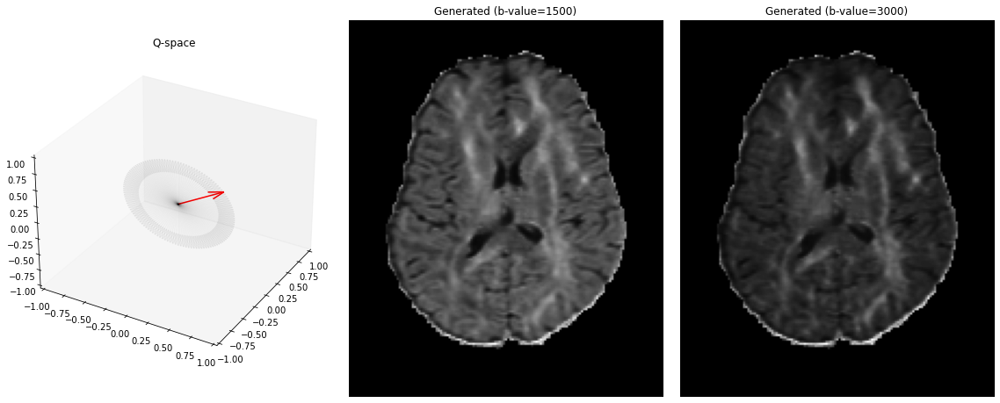

20
1.1822322607040405
1.1067718267440796


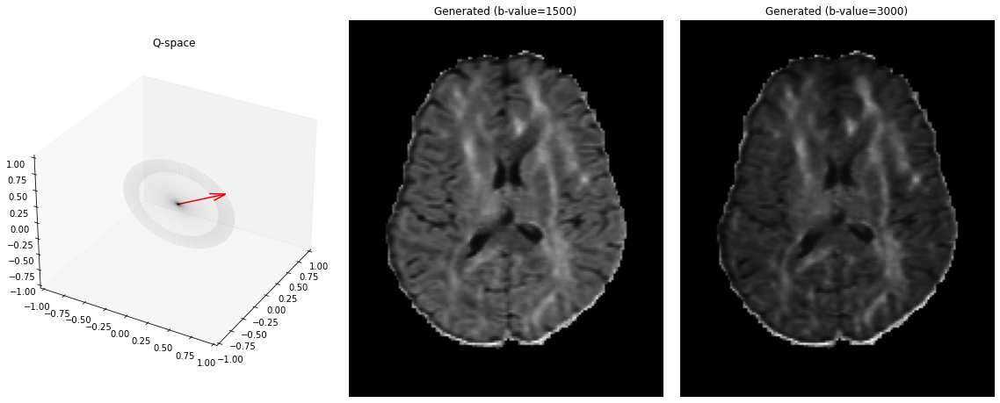

21
1.1906081438064575
1.1071083545684814


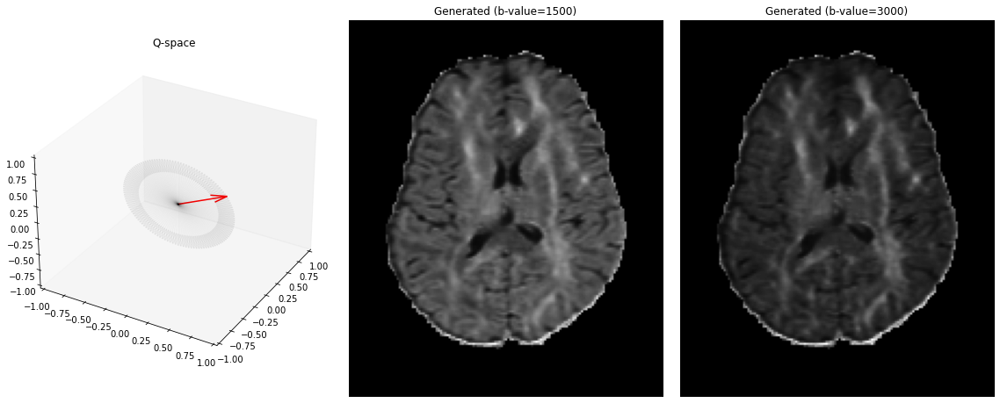

22
1.1986496448516846
1.1077138185501099


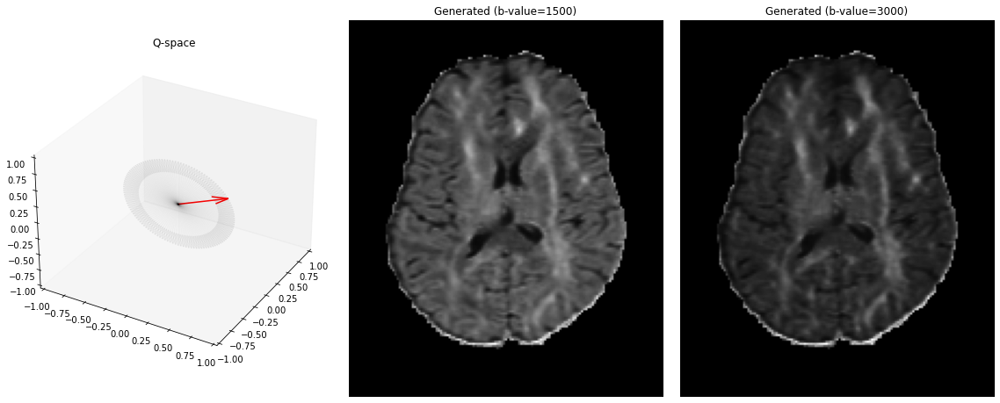

23
1.20684814453125
1.1086599826812744


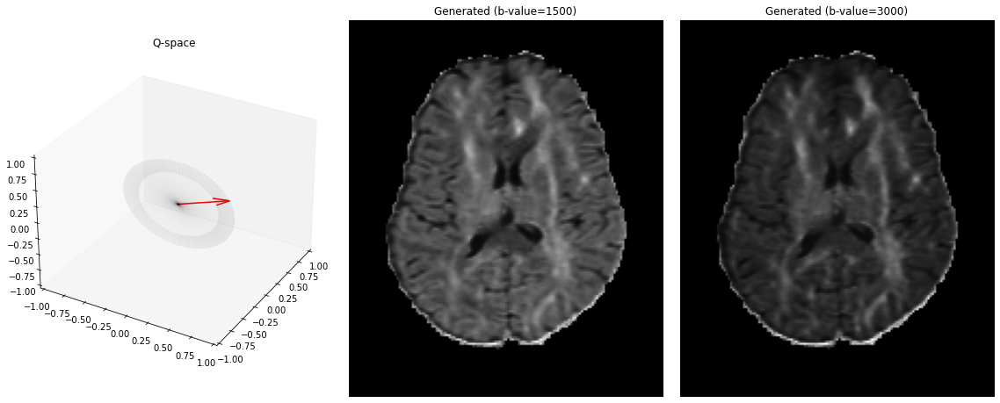

24
1.2138999700546265
1.1094962358474731


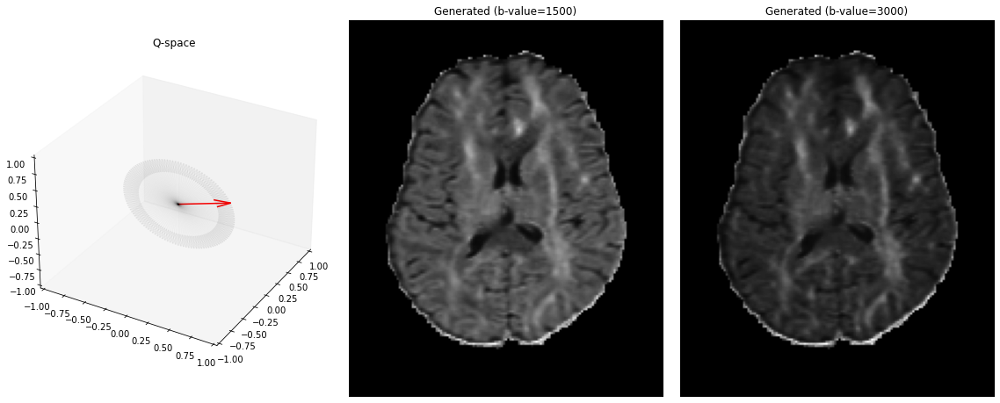

25
1.2206635475158691
1.110277771949768


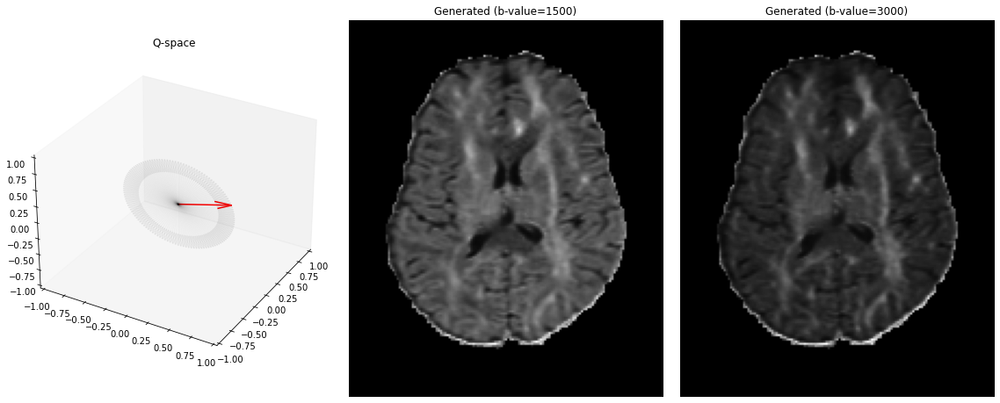

26
1.2242176532745361
1.1108801364898682


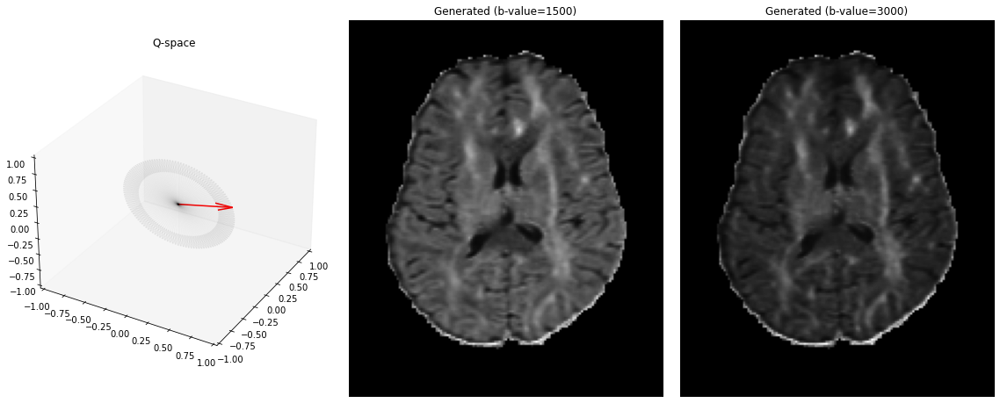

27
1.226842999458313
1.1114927530288696


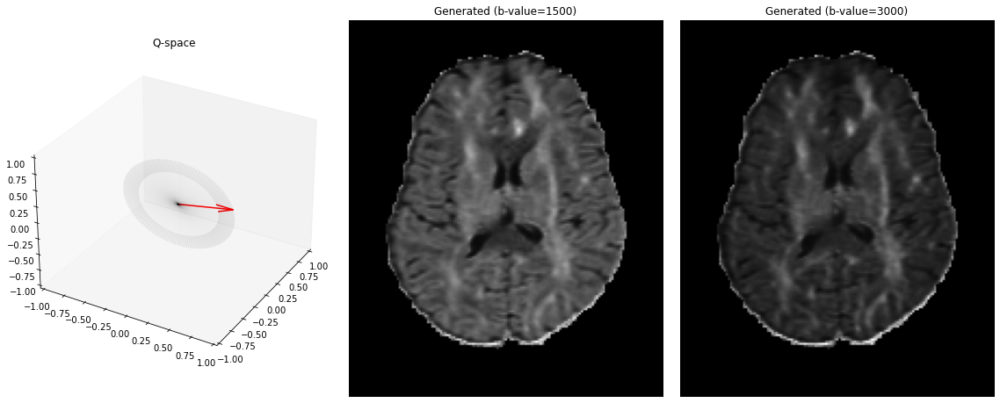

28
1.2287342548370361
1.1118043661117554


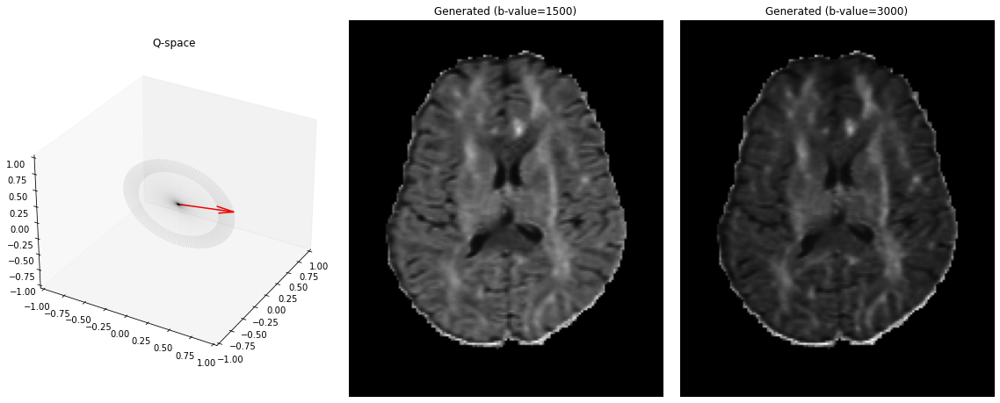

29
1.230340600013733
1.1115509271621704


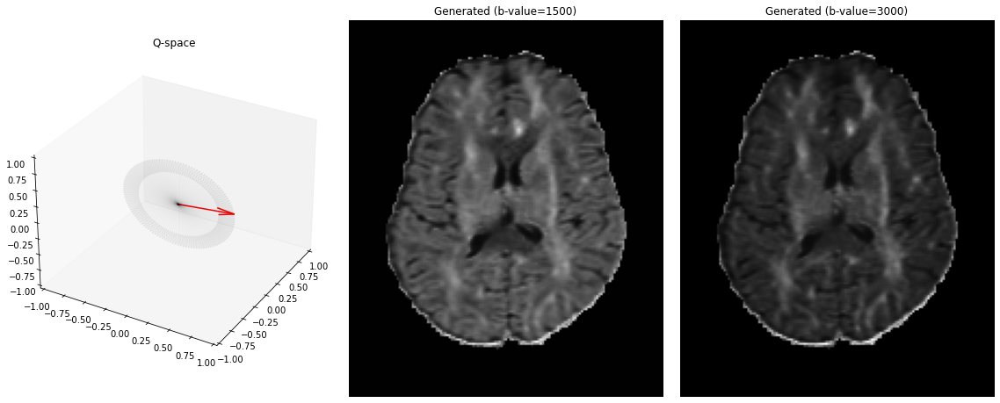

30
1.2315797805786133
1.1112713813781738


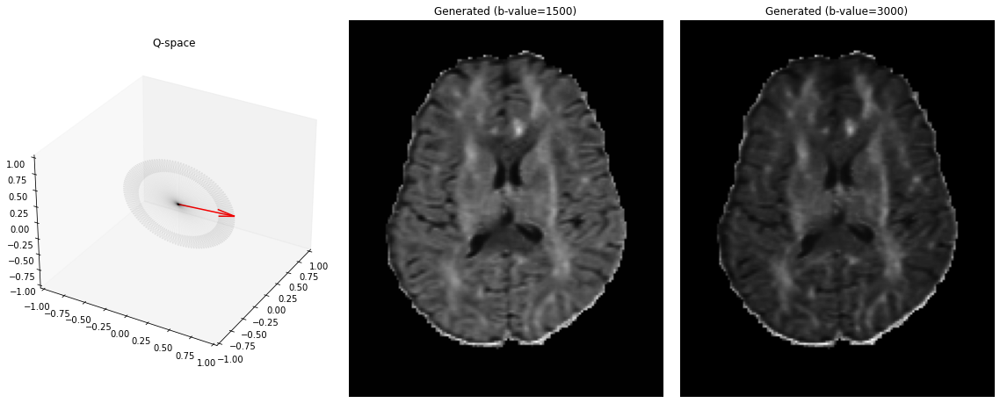

31
1.2322158813476562
1.1115859746932983


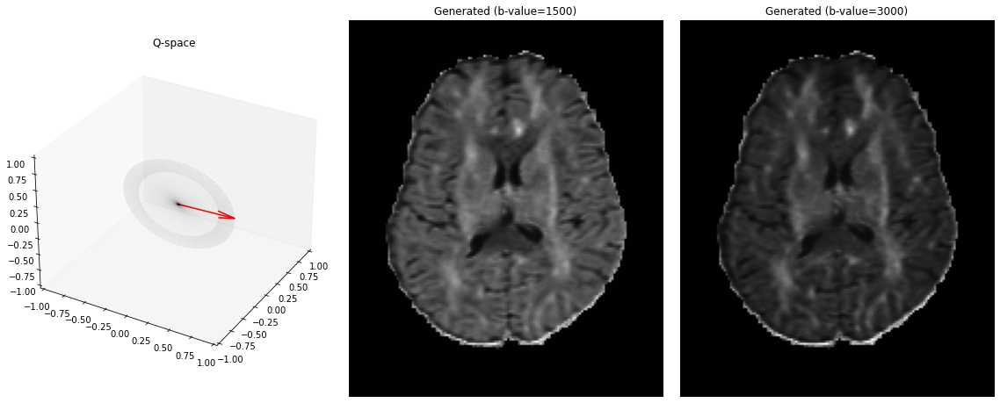

32
1.2311867475509644
1.1120774745941162


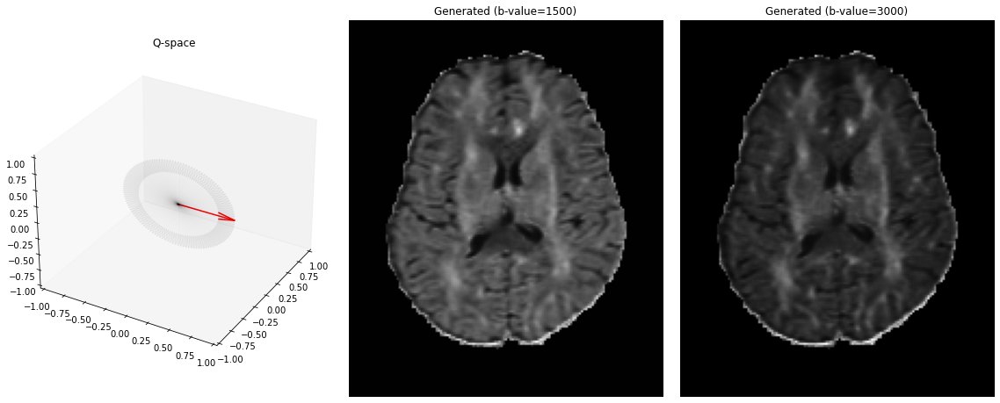

33
1.2281484603881836
1.1121023893356323


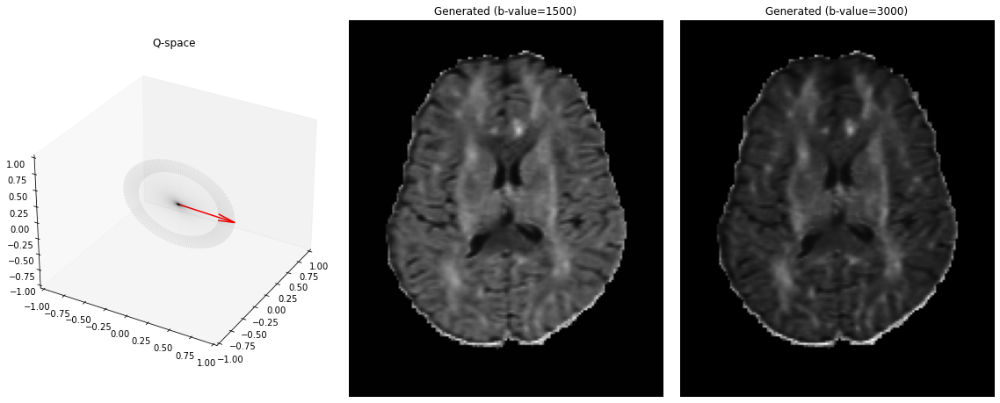

34
1.227256178855896
1.110843300819397


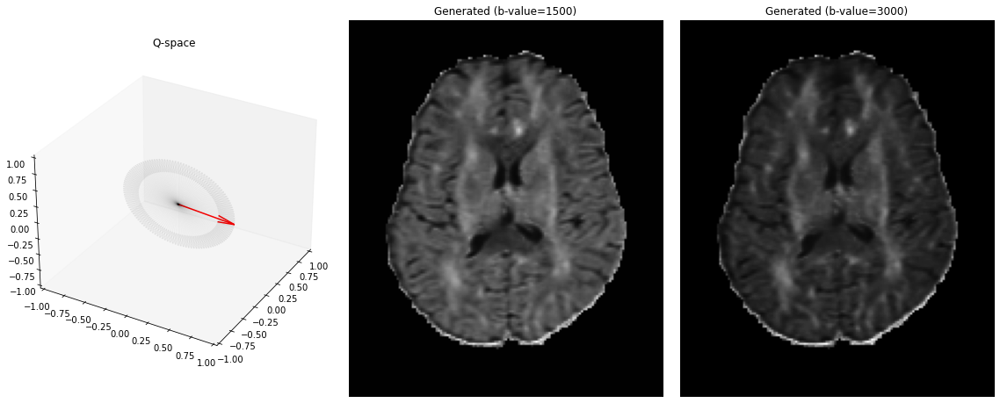

35
1.2250365018844604
1.1092822551727295


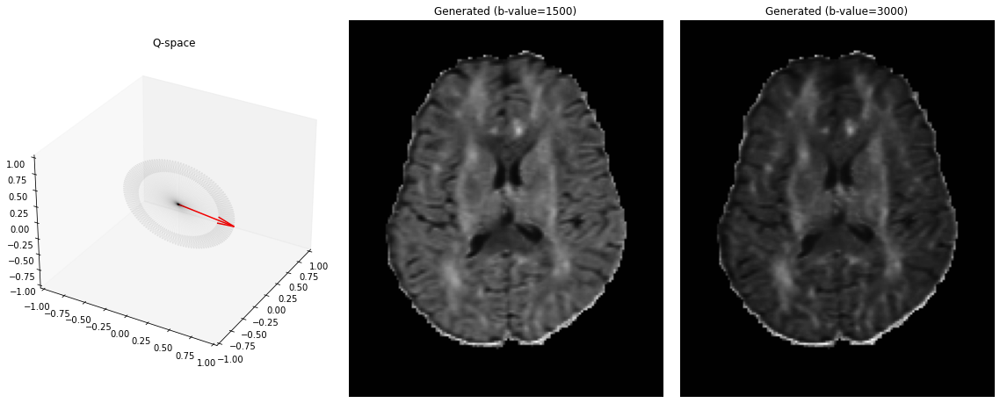

36
1.2225465774536133
1.107391357421875


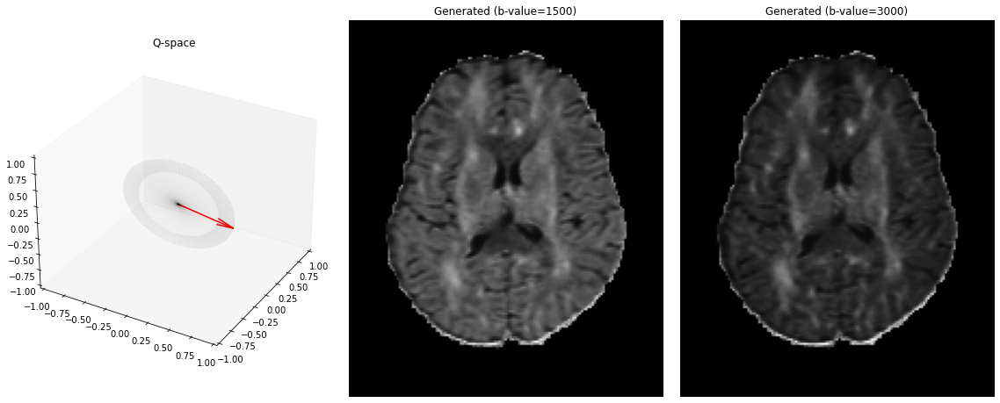

37
1.2191078662872314
1.1053190231323242


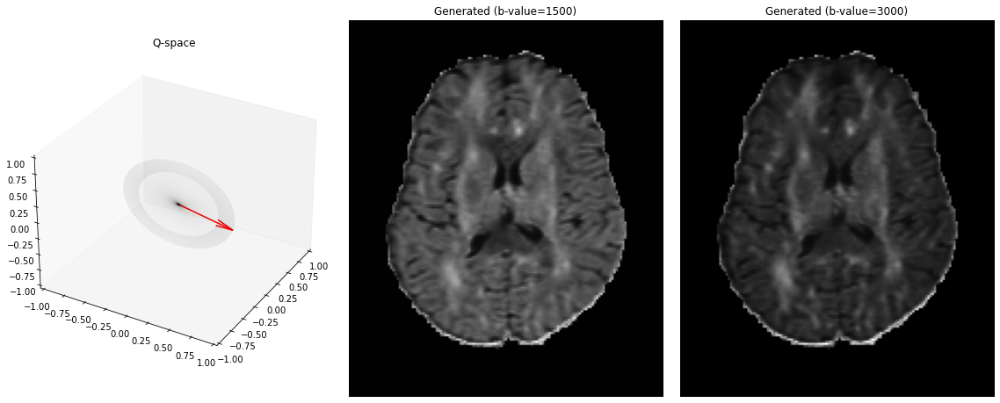

38
1.2147008180618286
1.1038203239440918


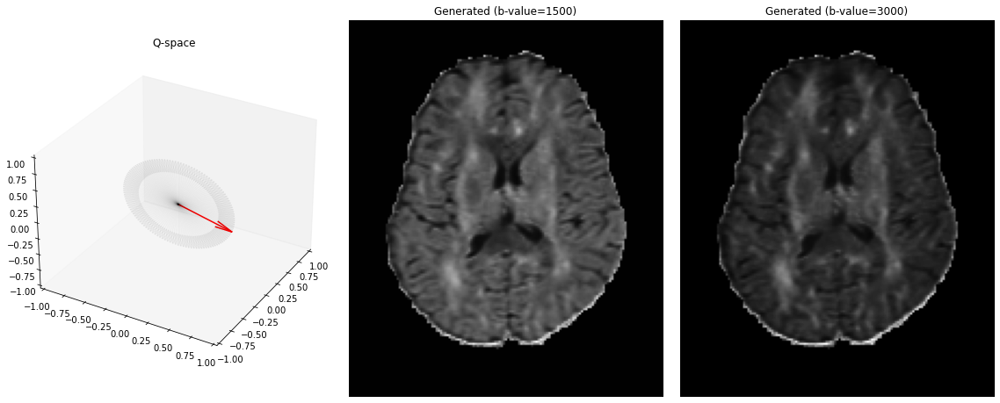

39
1.2099496126174927
1.1030741930007935


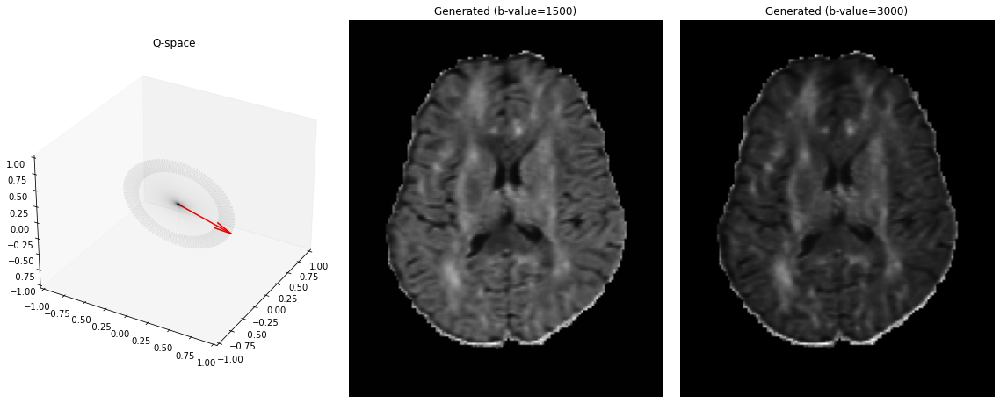

40
1.20296311378479
1.1022915840148926


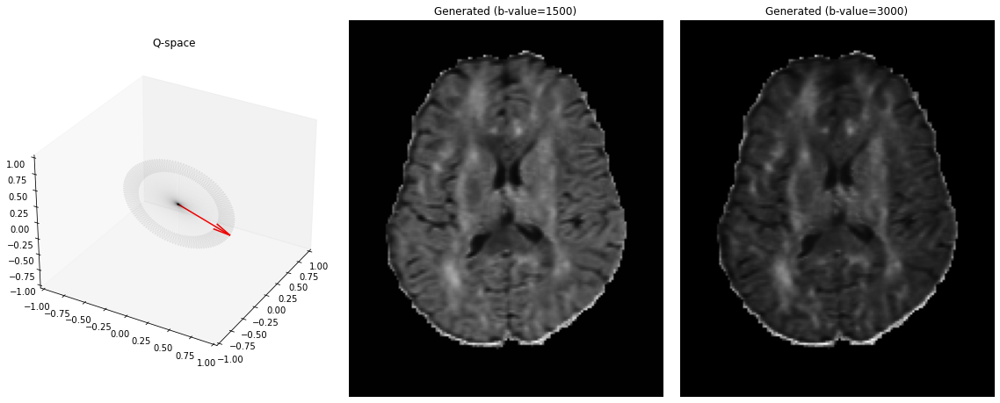

41
1.197998046875
1.101073980331421


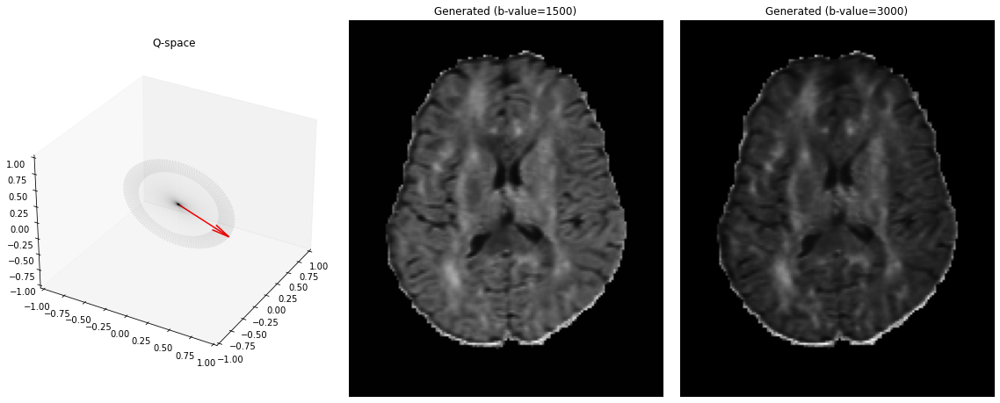

42
1.1914054155349731
1.0997077226638794


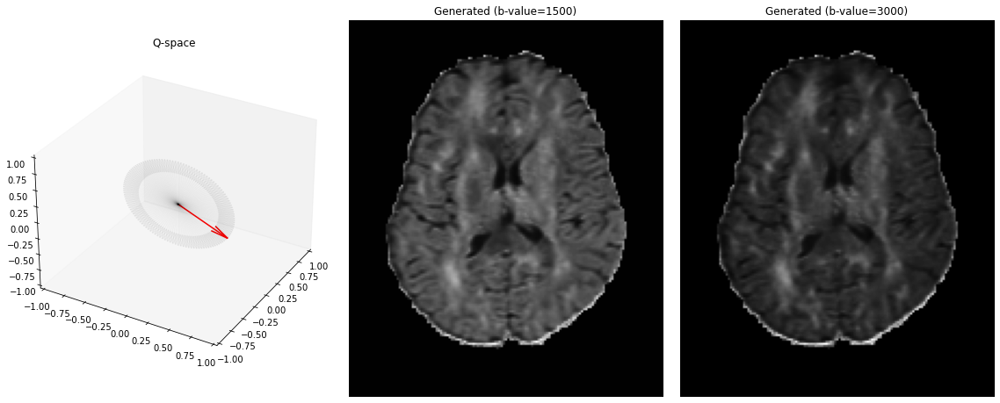

43
1.1882855892181396
1.0981923341751099


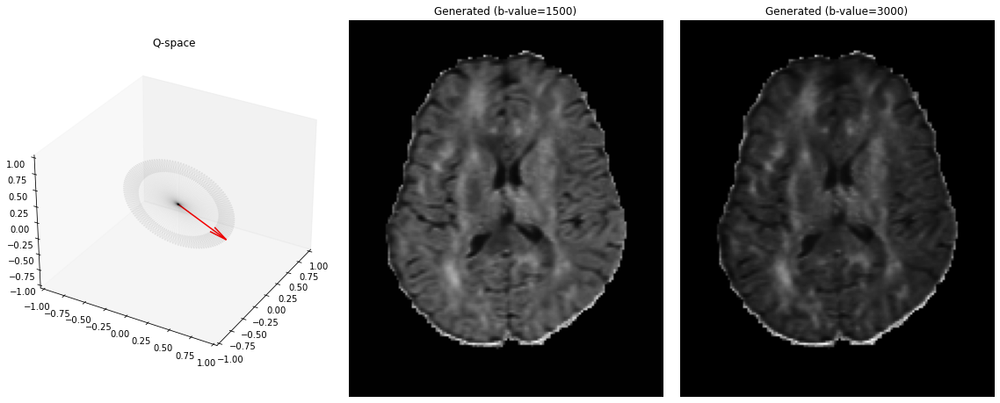

44
1.188405156135559
1.0962562561035156


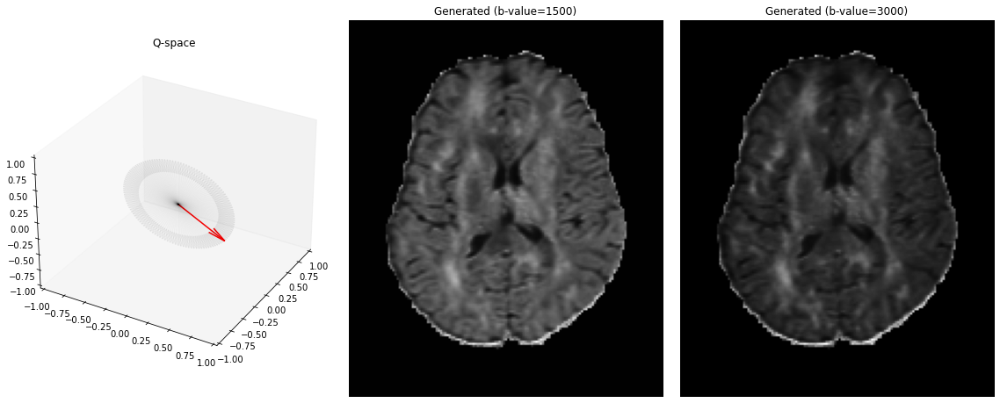

45
1.1900204420089722
1.0939452648162842


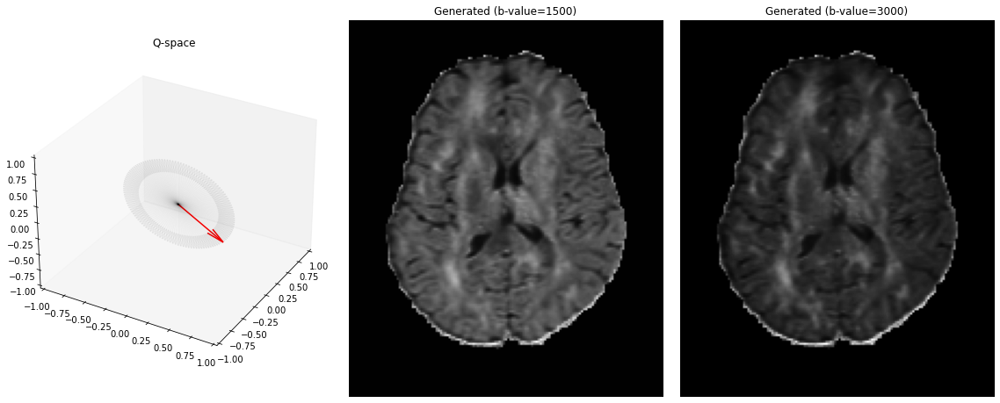

46
1.1917935609817505
1.0916308164596558


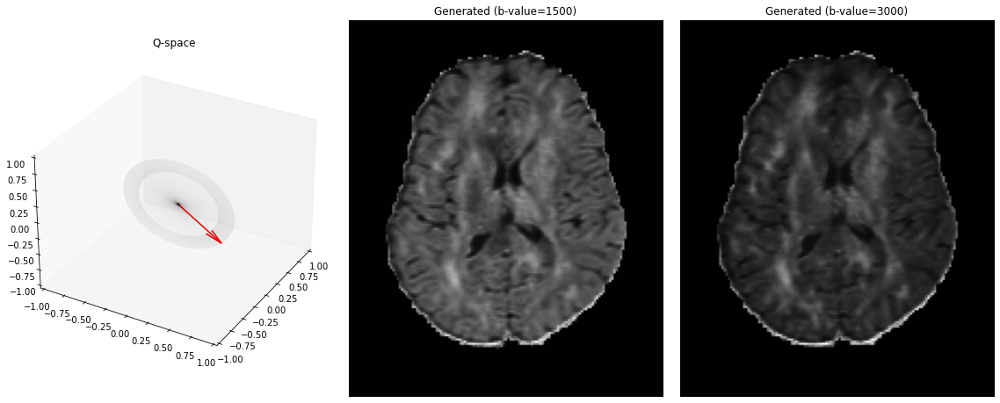

47
1.1916158199310303
1.092211365699768


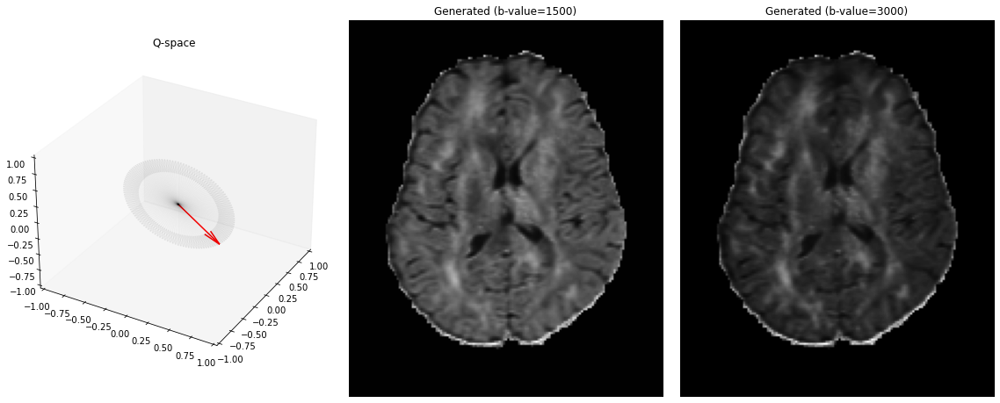

48
1.1915937662124634
1.09352445602417


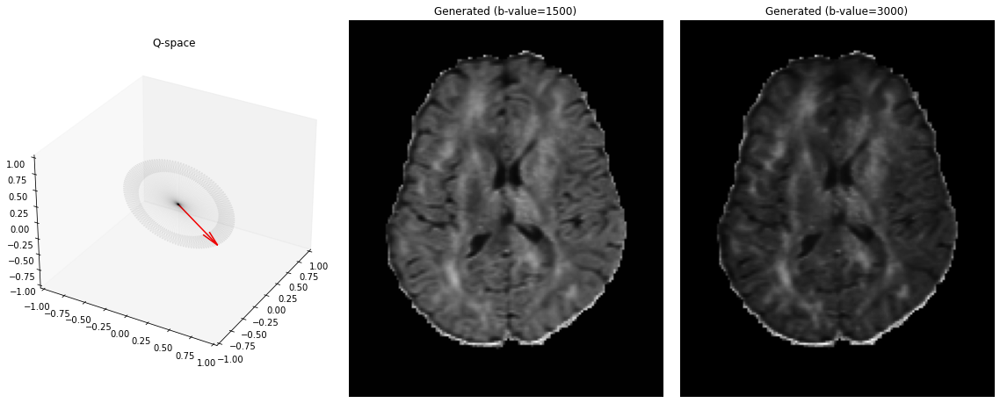

49
1.1961389780044556
1.0946742296218872


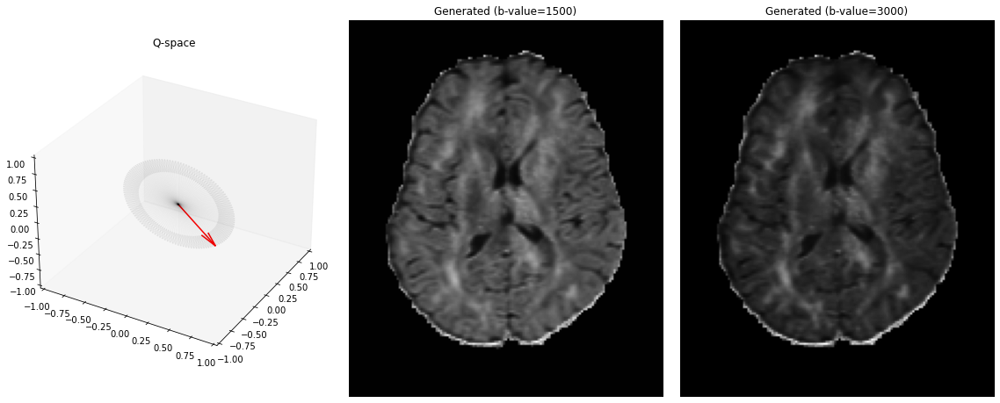

50
1.1992707252502441
1.0960298776626587


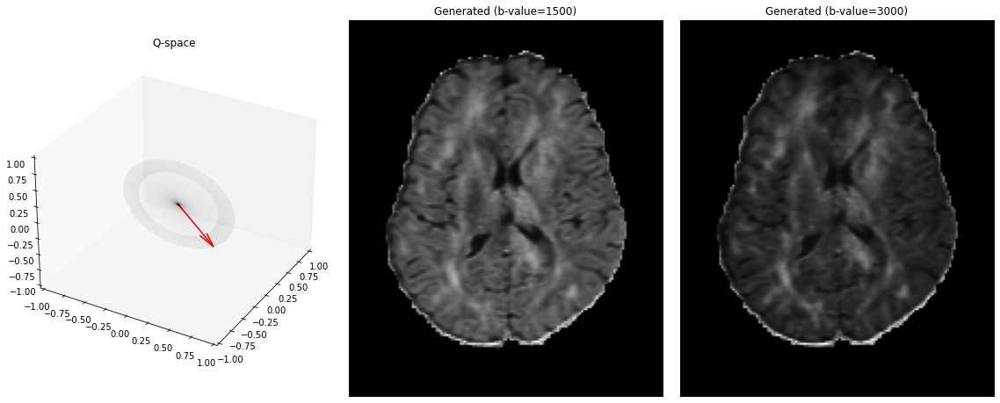

51
1.2012040615081787
1.097150206565857


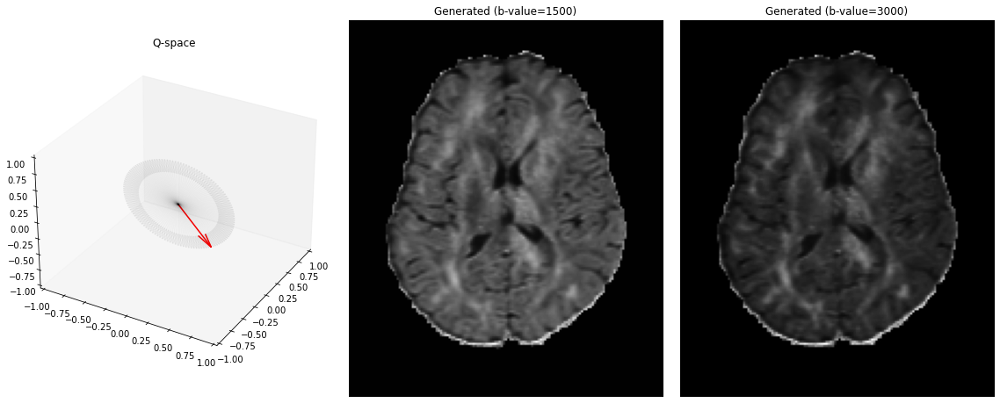

52
1.203222393989563
1.098514437675476


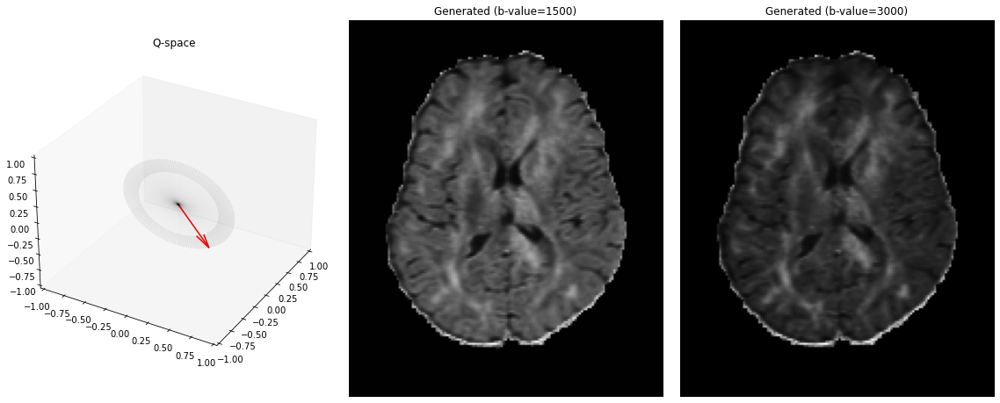

53
1.2065342664718628
1.0994845628738403


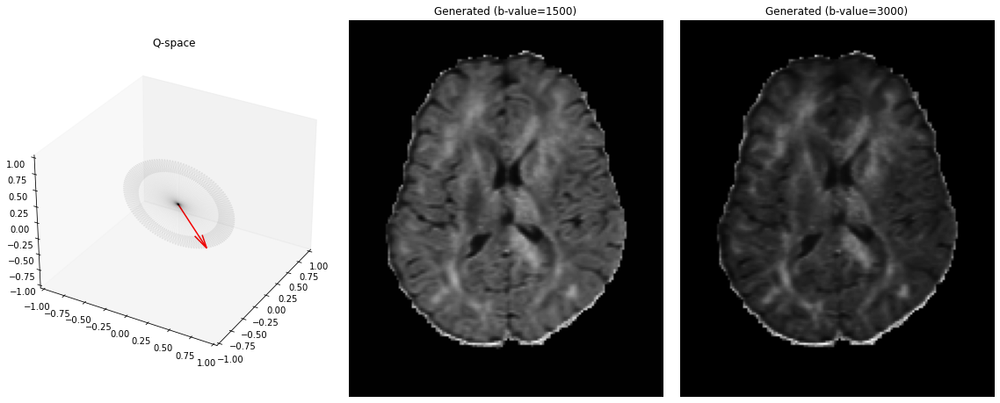

54
1.2093032598495483
1.100171446800232


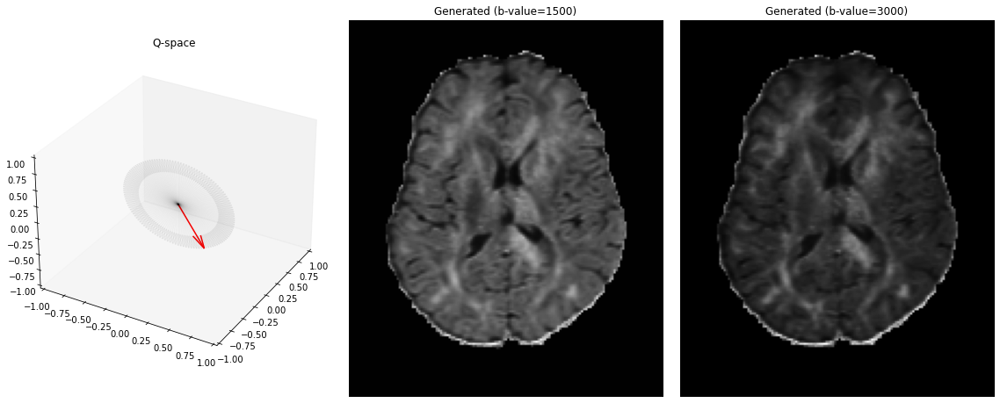

55
1.212670922279358
1.1005480289459229


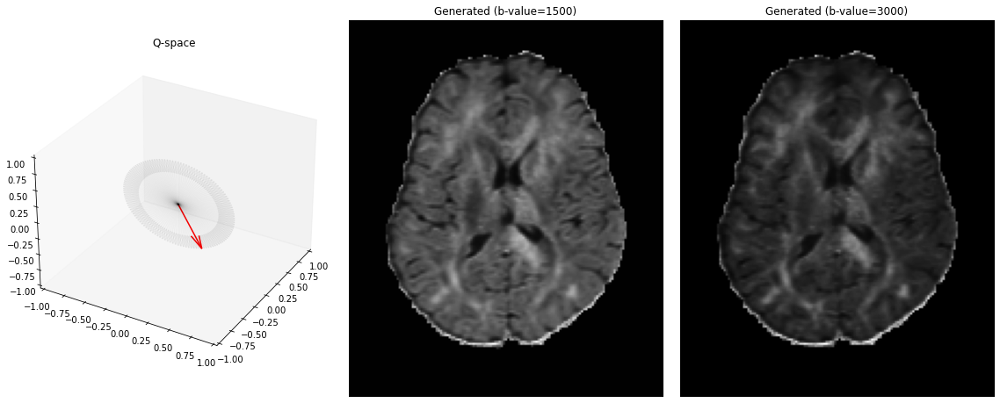

56
1.2152992486953735
1.1000317335128784


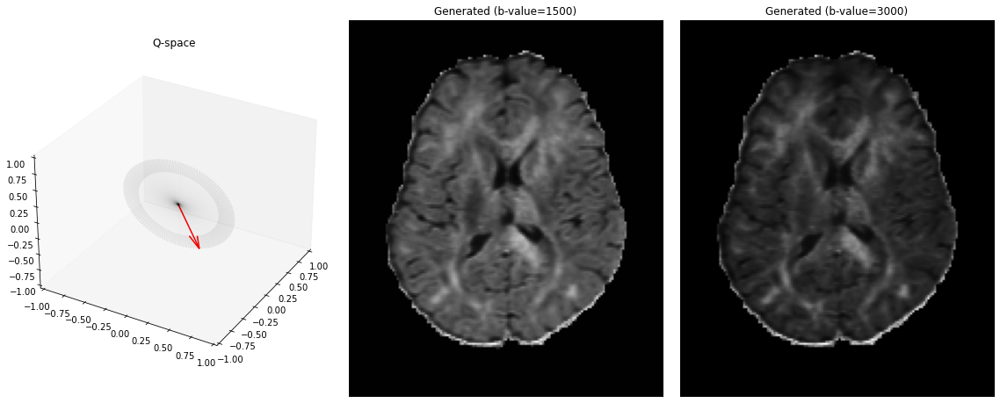

57
1.2167154550552368
1.0997592210769653


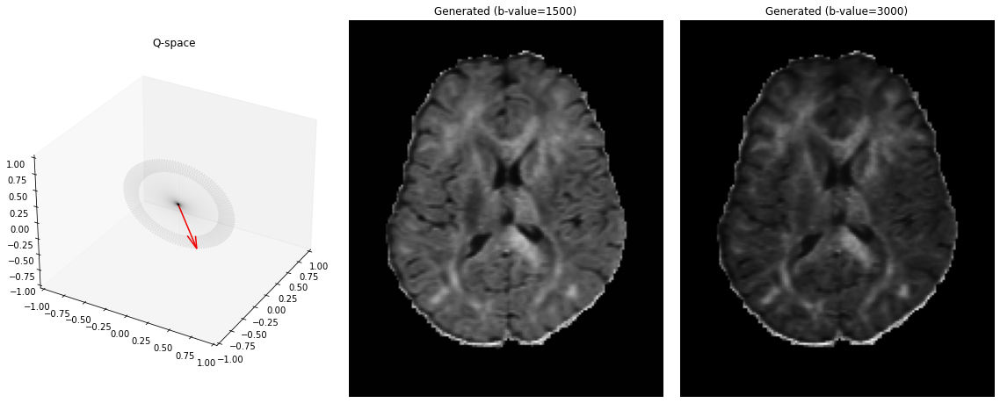

58
1.2175986766815186
1.0996427536010742


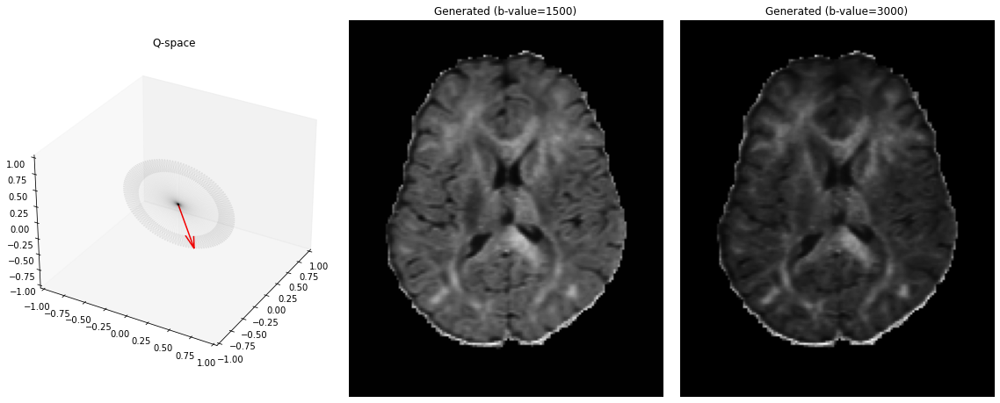

59
1.220188856124878
1.10025954246521


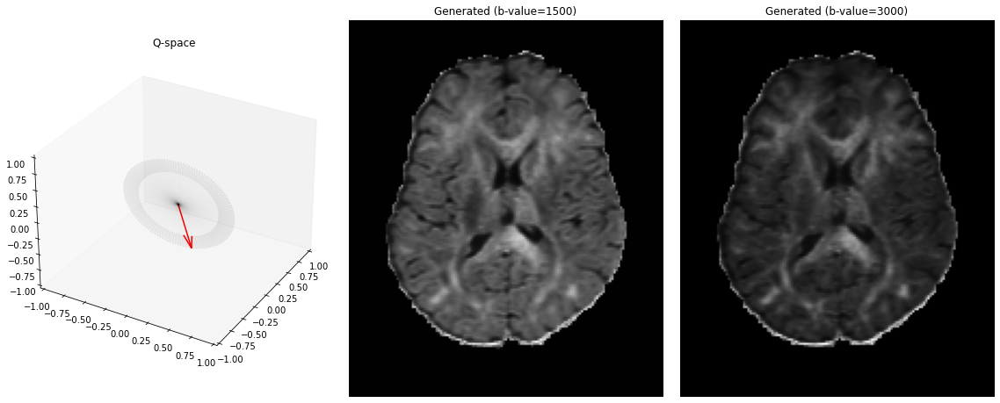

60
1.22284996509552
1.1010353565216064


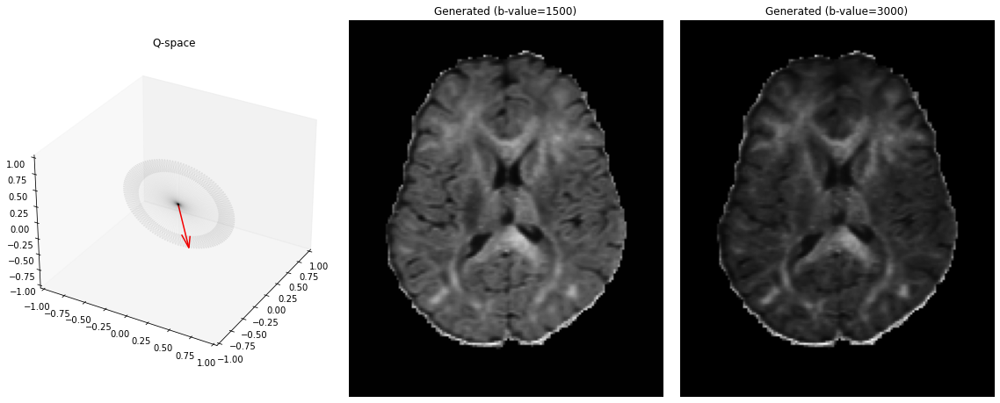

61
1.2233542203903198
1.1014879941940308


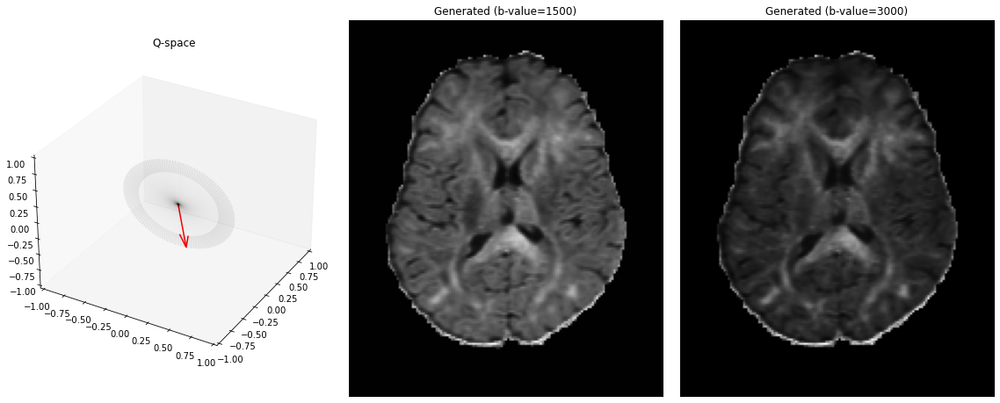

62
1.2215017080307007
1.1016002893447876


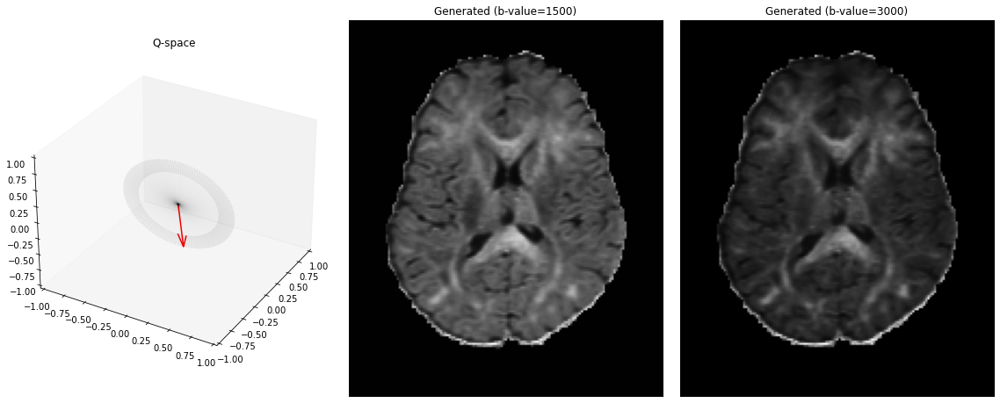

63
1.2179548740386963
1.1009759902954102


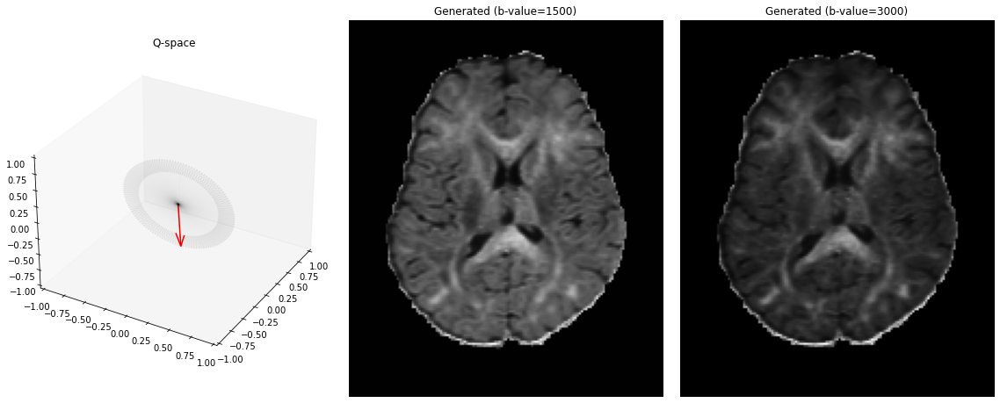

64
1.213861107826233
1.0994776487350464


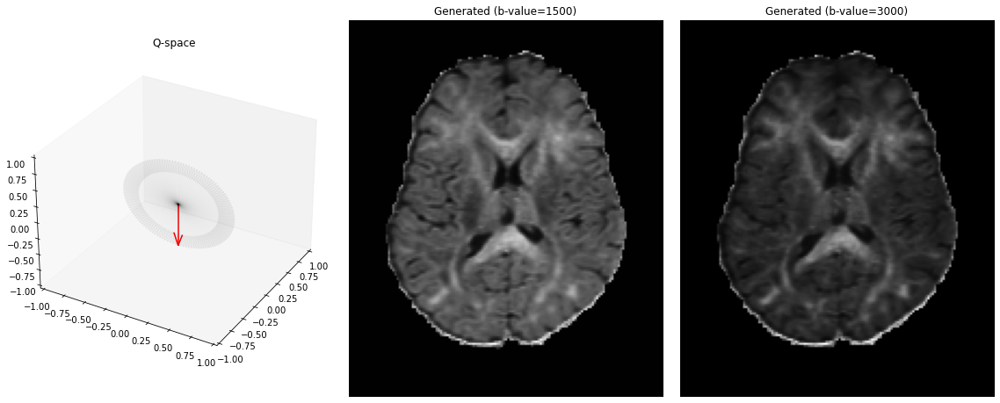

65
1.2090390920639038
1.0972950458526611


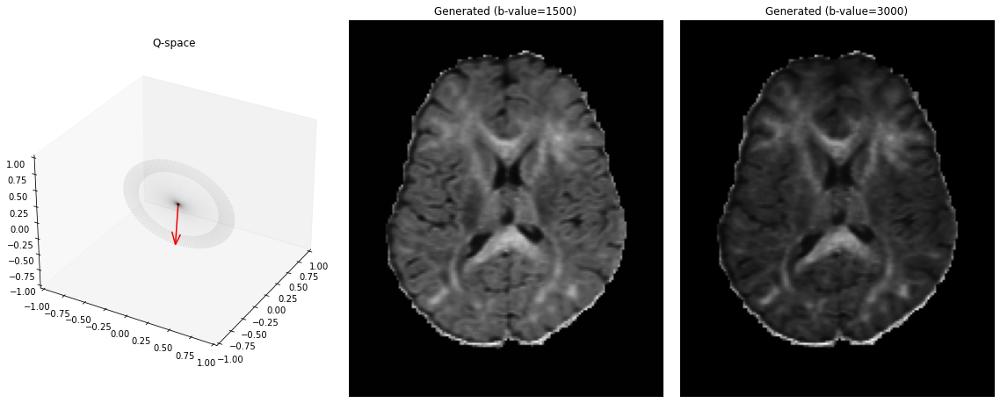

66
1.2051349878311157
1.094525933265686


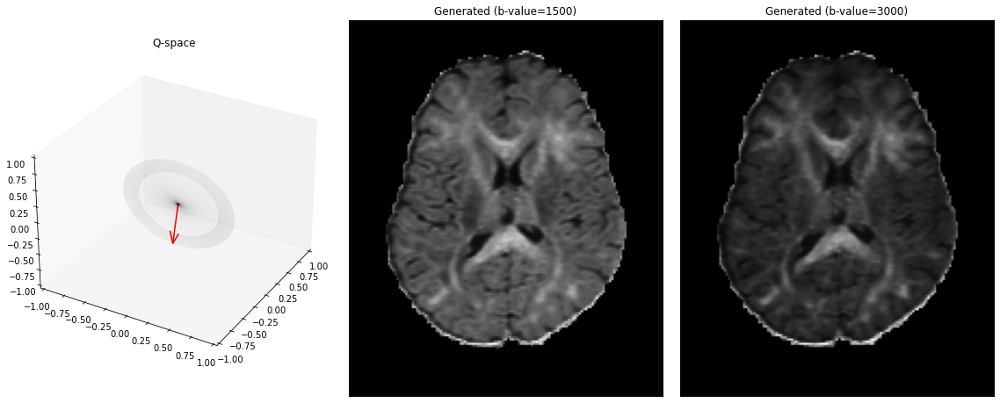

67
1.2014192342758179
1.091149091720581


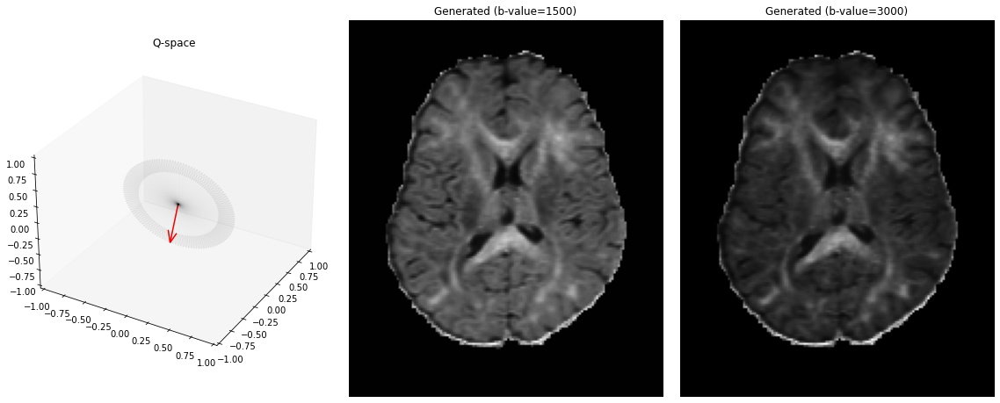

68
1.1984761953353882
1.0883785486221313


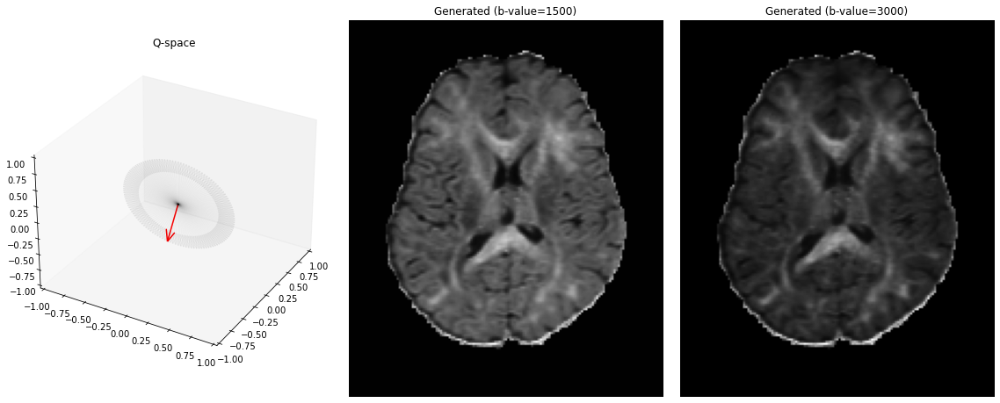

69
1.1949377059936523
1.0855967998504639


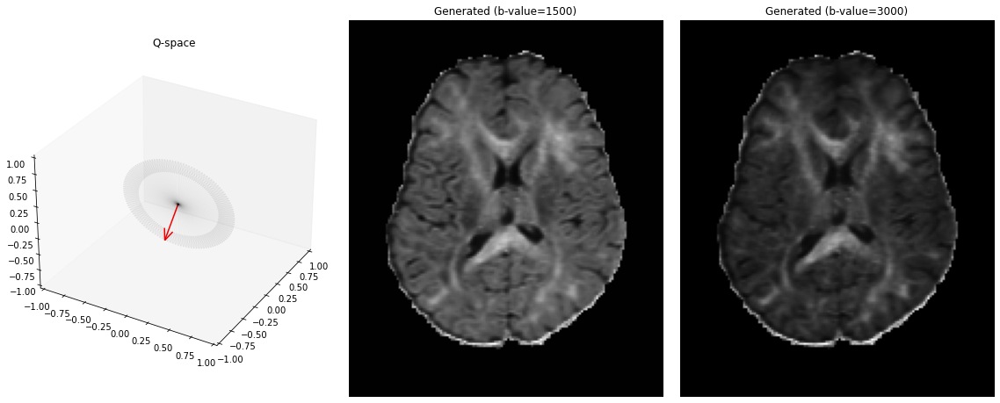

70
1.192452311515808
1.0840226411819458


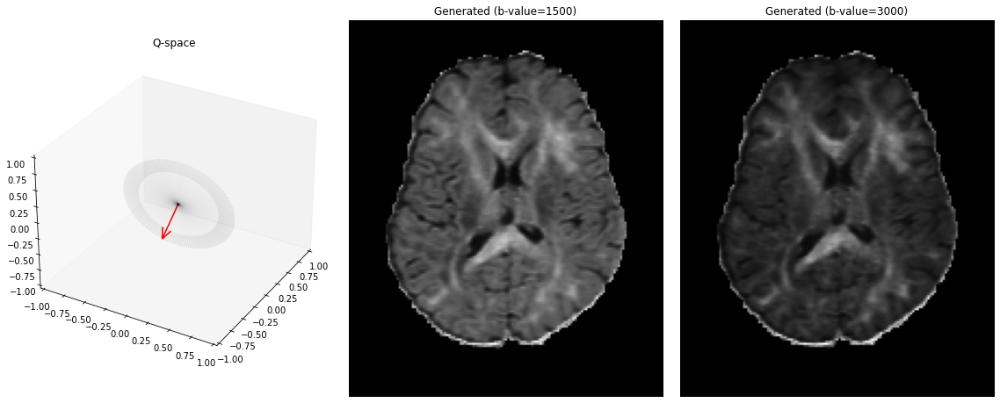

71
1.1904289722442627
1.0865473747253418


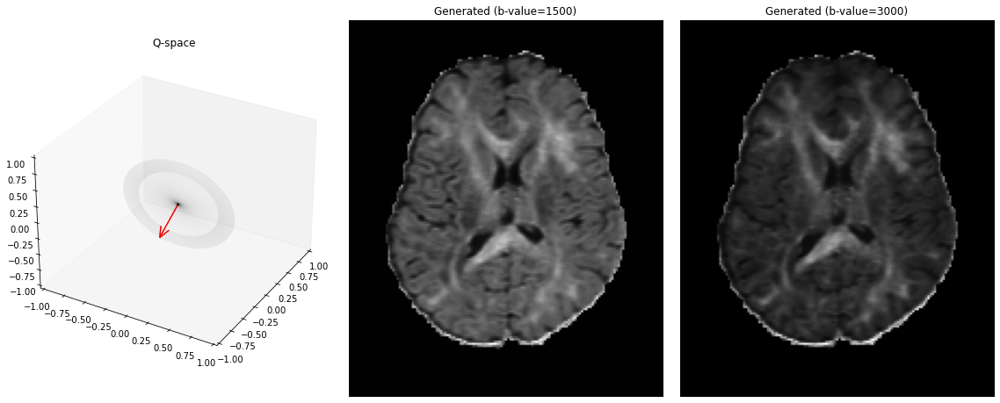

72
1.1887834072113037
1.0889337062835693


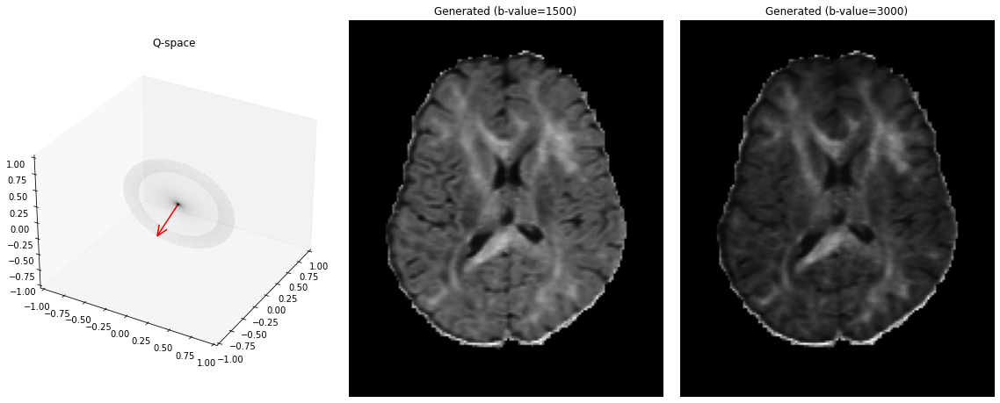

73
1.1868071556091309
1.0910488367080688


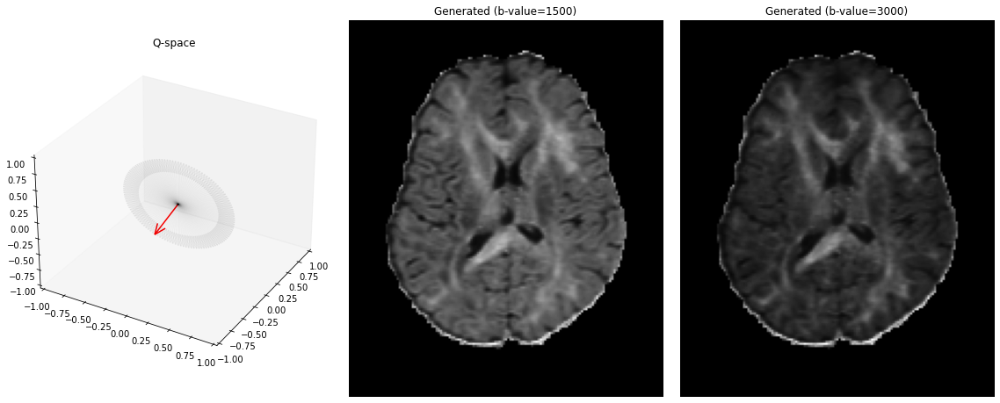

74
1.1870169639587402
1.0926513671875


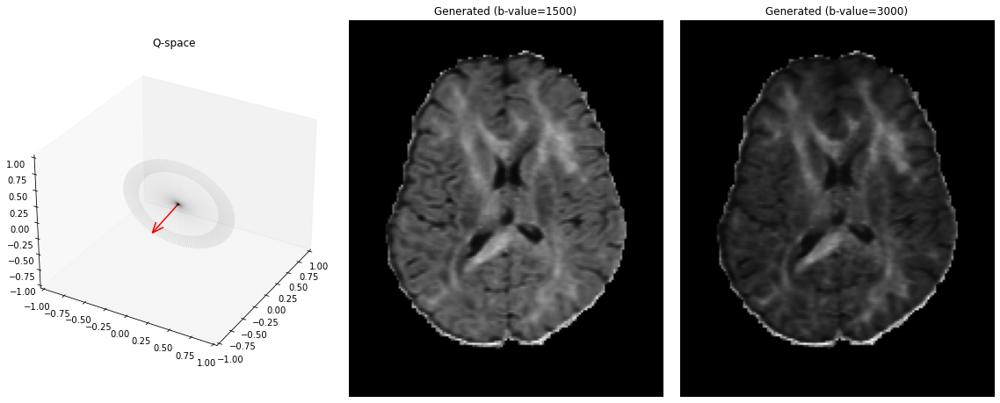

75
1.1868630647659302
1.0944364070892334


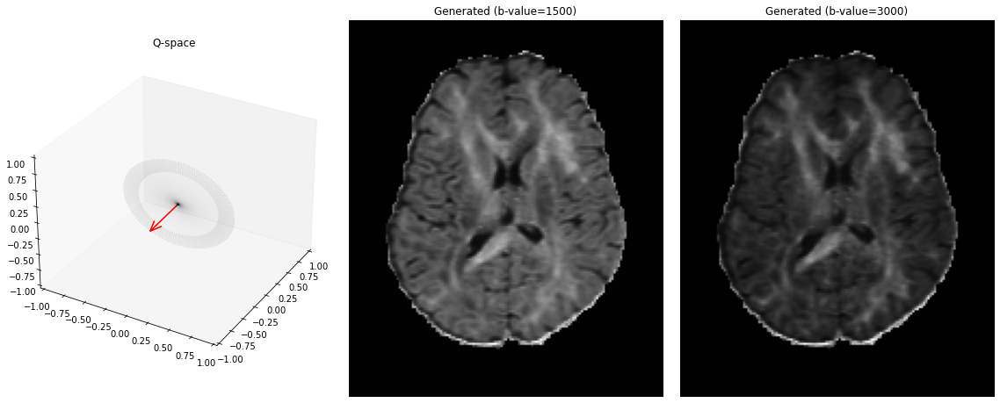

76
1.1884714365005493
1.0957390069961548


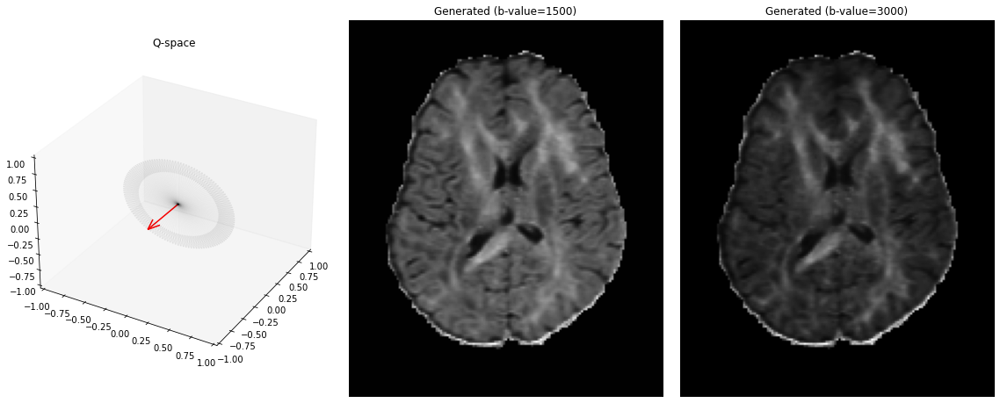

77
1.191083550453186
1.0962501764297485


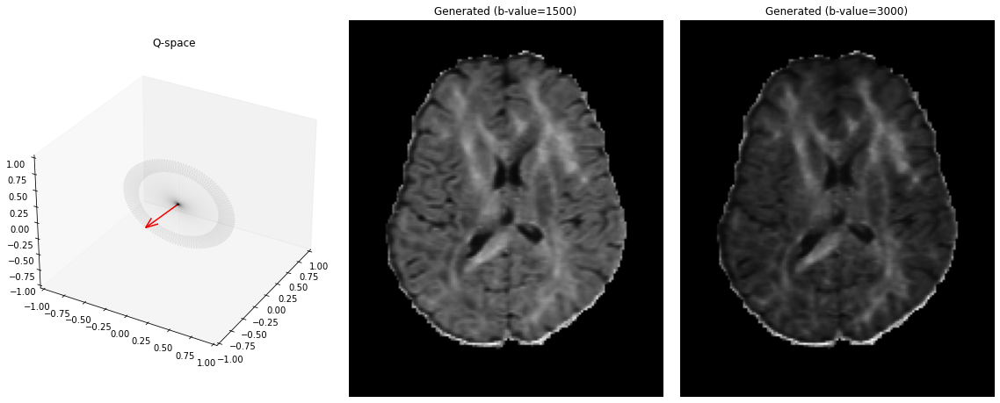

78
1.1926133632659912
1.0969433784484863


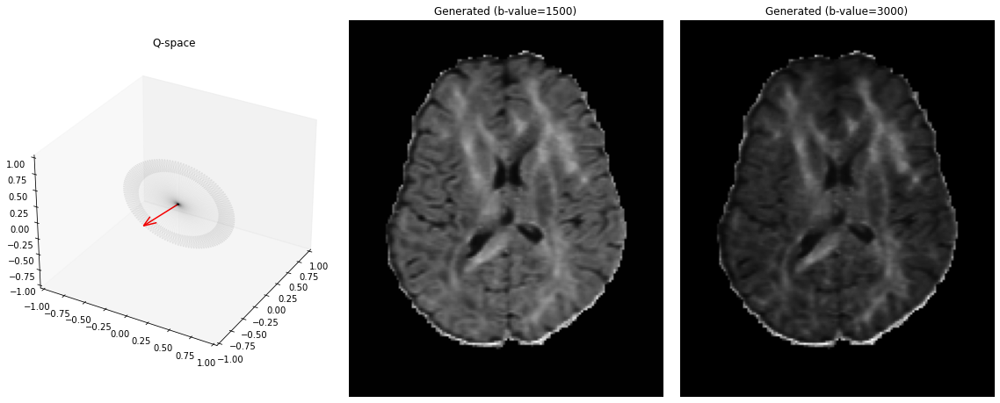

In [ ]:
sortidx = np.arange(len(bvals_synth)) 
for diridx in range(0,len(bvals_synth)):
    
    sorteddiridx = diridx 
    bvec = bvecs_synth[sorteddiridx]

    synth = synthesize_slice_per_bvec_bval(norm_b0, t2, t1, s, net, bvec, 1500/bval_max) # generate bvalue=1500
    print(synth.max())
    
    fig = plt.figure(figsize=plt.figaspect(0.5))
    axs = fig.add_subplot(1,3,1,projection='3d')
    X, Y, Z = bvecs_synth[:, 0]* (bvals_synth/bval_max), \
              bvecs_synth[:, 1]* (bvals_synth/bval_max), \
              bvecs_synth[:, 2]* (bvals_synth/bval_max)
    axs.quiver(np.zeros(len(bvals_synth)),np.zeros(len(bvals_synth)),np.zeros(len(bvals_synth)),
               X, Y, Z, length=1, color='black', alpha=.03)
    axs.set_xlim(-1, 1)
    axs.set_ylim(-1, 1)
    axs.set_zlim(-1, 1)
    tmp_planes = axs.zaxis._PLANES
    axs.zaxis._PLANES = (tmp_planes[2], tmp_planes[3],
                         tmp_planes[0], tmp_planes[1],
                         tmp_planes[4], tmp_planes[5])

    axs.grid(False)
    axs.quiver(0,0,0,X[sorteddiridx], Y[sorteddiridx], Z[sorteddiridx], length=1, color='red')
    axs.set_title('Q-space'.format(X[sorteddiridx], Y[sorteddiridx], Z[sorteddiridx]))
    
    axs = fig.add_subplot(1,3,2)
    axs.imshow(np.flip(synth.T, 0), cmap=plt.get_cmap('gray'))
    axs.axis('off')
    axs.set_title('Generated (b-value=1500)')
    
    synth2 = synthesize_slice_per_bvec_bval(norm_b0, t2, t1, s, net, bvec, 3000/bval_max) # change b-value
    print(synth2.max())

    axs = fig.add_subplot(1,3,3)
    axs.imshow(np.flip(synth2.T, 0), cmap=plt.get_cmap('gray'))
    axs.axis('off')
    axs.set_title('Generated (b-value=3000)')
    
    
    fig.tight_layout(pad=2)
    #savename = '../video-dwi-synthesis/{}.jpg'.format(str(diridx).zfill(3))
    #fig.savefig(savename)
    #plt.close(fig)    # close the figure window
    
    plt.show()